# Imports

In [70]:
import os
import pickle
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from darts import TimeSeries
from darts.dataprocessing import Pipeline
from darts.dataprocessing.transformers import Scaler
from darts.metrics import mae, mape, rmse
from darts.models import (
    FFT,
    AutoARIMA,
    ExponentialSmoothing,
    LightGBMModel,
    LinearRegressionModel,
    NaiveDrift,
    NaiveMean,
    NaiveMovingAverage,
    NaiveSeasonal,
    NBEATSModel,
    Prophet,
    RNNModel,
    Theta,
)
from darts.timeseries import concatenate
from darts.utils.missing_values import (
    extract_subseries,
    fill_missing_values,
    missing_values_ratio,
)
from darts.utils.model_selection import train_test_split
from pandas.plotting import register_matplotlib_converters
from pylab import rcParams
# from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from darts.utils.statistics import plot_acf, plot_pacf, plot_ccf
from statsmodels.tsa.seasonal import STL, seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from tqdm.auto import tqdm

In [71]:
# from pipeline_5g.utils import adf_test

In [72]:
# %matplotlib inline
warnings.filterwarnings("ignore")
# %config InlineBackend.figure_format='retina'

register_matplotlib_converters()
# sns.set(style='whitegrid', palette='muted', font_scale=1.5)
sns.set_theme()


rcParams["figure.figsize"] = 20, 5
# tqdm.pandas()

## Funções utilizadas

In [73]:
# Funções
def split_by_uid_into_dfs(df: pd.DataFrame) -> list:
    """
    Splits a DataFrame with 'Timestamp' and 'RSRP' columns containing lists
    into a list of DataFrames, one for each Uid, with 'Timestamp' as the index.

    Parameters:
        df (pd.DataFrame): Original DataFrame with columns 'Uid', 'Timestamp', 'RSRP' (as lists).

    Returns:
        list_of_dfs (list): List of DataFrames (one for each Uid),
                            with 'Timestamp' as the index and 'RSRP' as the column.
    """
    # Explode list columns
    df_exploded = df[['Uid', 'Timestamp', 'RSRP']].explode(['Timestamp', 'RSRP'])

    # Ensure Timestamp is in datetime format
    df_exploded['Timestamp'] = pd.to_datetime(df_exploded['Timestamp'])

    # Create one DataFrame per Uid with Timestamp as index
    list_of_dfs = [
        group.set_index('Timestamp')[['RSRP']].sort_index()
        for _, group in df_exploded.groupby('Uid')
    ]

    return list_of_dfs

def detect_periodicity_fft(series, plot=True):
    """
    Detects the dominant periodicity of a time series using FFT.
    
    Parameters:
    - series: Darts TimeSeries object
    - plot: bool, if True, plots the frequency spectrum
    
    Returns:
    - dominant_freq: dominant frequency
    - dominant_period: dominant period (in number of points)
    """
    y = series.values().flatten()
    
    fft_vals = np.fft.fft(y - np.mean(y))
    freqs = np.fft.fftfreq(len(y))
    
    positive_freqs = freqs[freqs > 0]
    positive_fft = np.abs(fft_vals[freqs > 0])
    
    dominant_freq = positive_freqs[np.argmax(positive_fft)]
    dominant_period = 1 / dominant_freq

    print(f"Dominant frequency: {dominant_freq}")
    print(f"Estimated period: {dominant_period:.1f} points")

    if plot:
        plt.figure(figsize=(10, 4))
        plt.plot(positive_freqs, positive_fft)
        plt.title("Frequency Spectrum (FFT)")
        plt.xlabel("Frequency")
        plt.ylabel("Amplitude")
        plt.grid(True)
        plt.show()
        
    return dominant_freq, dominant_period

def plot_rsrp_distribution(df):
    # Flatten os valores de RSRP em uma única lista
    values = [val for sublist in df["RSRP"] for val in sublist if val is not None]

    # Categorias conforme a tabela fornecida
    bins = [-140, -100, -90, -80, 0]  # limites de categorias
    colors = ['red', 'orange', 'yellow', 'green']
    labels = ['Cell Edge', 'Mid Cell', 'Good', 'Excellent']

    # Criar histograma
    n, bins, patches = plt.hist(values, bins=bins, edgecolor='black')

    # Aplicar cores às barras
    for patch, color in zip(patches, colors):
        patch.set_facecolor(color)

    # Adicionar legenda
    handles = [plt.Rectangle((0, 0), 1, 1, color=color) for color in colors]
    plt.legend(handles, labels)

    # Título e rótulos
    plt.title('Distribuição de RSRP por Categoria de Qualidade de Sinal')
    plt.xlabel('RSRP (dBm)')
    plt.ylabel('Frequência')
    plt.grid(True)
    plt.show()

def plot_splits_by_uid(df):
    # Divide o DataFrame em múltiplos DataFrames baseados no UID
    list_of_splits = split_by_uid_into_dfs(df)
    
    # Plota cada DataFrame resultante
    for idx, split in enumerate(list_of_splits):
        plt.figure(figsize=(10, 6))
        split.plot(title=f'Série {idx}')
        plt.xlabel('Índice')
        plt.ylabel('Valor')
        plt.grid()
        plt.show()

def plot_pearson_correlation(df: pd.DataFrame, metrics: list = None, show: bool = True):
    """
    Gera e retorna o objeto matplotlib contendo o mapa de calor da correlação de Pearson,
    com termos traduzidos segundo a norma ABNT.

    Parâmetros
    ----------
    df : pd.DataFrame
        DataFrame com colunas contendo listas por Uid.
    metrics : list, opcional
        Lista de colunas a considerar como métricas. 
        Se None, utiliza ['RSRP', 'RSRQ', 'SNR', 'CQI', 'RSSI', 'Throughput', 'Speed'].
    show : bool, opcional
        Se True, exibe o gráfico.

    Retorna
    -------
    fig, ax : matplotlib.pyplot.Figure, matplotlib.pyplot.Axes
        Objetos matplotlib para manipulação ou salvamento posterior.
    """
    # Definir métricas padrão (sem UL_bitrate e renomeando DL_bitrate -> Throughput)
    if metrics is None:
        metrics = ['RSRP', 'RSRQ', 'SNR', 'CQI', 'RSSI', 'Speed', 'Throughput']

    # Copiar DF com renomeação de coluna
    df = df.copy()
    if 'DL_bitrate' in df.columns:
        df = df.rename(columns={'DL_bitrate': 'Throughput'})
    if 'UL_bitrate' in df.columns:
        df = df.drop(columns=['UL_bitrate'])

    # Expandir listas em colunas
    exploded_df = pd.DataFrame()
    for col in metrics:
        exploded = df[['Uid', col]].explode(col)
        exploded[col] = pd.to_numeric(exploded[col], errors='coerce')
        
        if exploded_df.empty:
            exploded_df = exploded
        else:
            exploded_df[col] = exploded[col].values

    # Remover linhas com NaN
    exploded_df = exploded_df.dropna(subset=metrics)

    # Calcular correlação de Pearson
    correlation_matrix = exploded_df[metrics].corr(method='pearson')

    # Criar heatmap
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(
        correlation_matrix,
        annot=True,
        cmap='coolwarm',
        center=0,
        linewidths=0.5,
        ax=ax
    )

    # Ajustar rótulos para ABNT (nomes em português)
    labels = {
        "RSRP": "RSRP",
        "RSRQ": "RSRQ",
        "SNR": "SNR",
        "CQI": "CQI",
        "RSSI": "RSSI",
        "Speed": "Velocidade",
        "Throughput": "Throughput"
    }
    ax.set_xticklabels([labels.get(item.get_text(), item.get_text()) for item in ax.get_xticklabels()])
    ax.set_yticklabels([labels.get(item.get_text(), item.get_text()) for item in ax.get_yticklabels()])

    fig.tight_layout()

    if show:
        plt.show()

    return fig, ax

In [74]:
def adf_test(series: pd.Series) -> tuple[float, bool]:
    """
    Executa o teste ADF em uma série temporal.
    
    Retorna
    -------
    pvalue : float
        P-valor do teste ADF.
    is_stationary : bool
        True se rejeitamos H0 (série estacionária).
    """
    series = pd.Series(series).dropna()
    
    # Teste ADF
    result = adfuller(series, autolag='AIC')
    pvalue = result[1]
    is_stationary = pvalue < 0.05
    return pvalue, is_stationary

def adf_summary(df: pd.DataFrame) -> pd.DataFrame:
    """
    Aplica o teste ADF em todas as séries de DL_bitrate por trace (Uid).

    Parâmetros
    ----------
    df : pd.DataFrame
        DataFrame no formato apresentado, contendo colunas ['Uid', 'DL_bitrate'].

    Retorno
    -------
    pd.DataFrame
        Tabela com Uid, p-valor e indicador de estacionariedade.
    """
    results = []
    
    for _, row in df.iterrows():
        uid = row["Uid"]
        dl_bitrate = row["DL_bitrate"]

        if isinstance(dl_bitrate, (list, np.ndarray)):
            pvalue, stationary = adf_test(dl_bitrate)
            results.append({"Uid": uid,
                            "p-valor": round(pvalue, 4),
                            "Estacionária": "Sim" if stationary else "Não"})
    
    return pd.DataFrame(results)



def plot_stationarity_counts(adf_results: pd.DataFrame, show: bool = True):
    """
    Gera gráfico de barras mostrando percentual de séries estacionárias vs não estacionárias.

    Parâmetros
    ----------
    adf_results : pd.DataFrame
        DataFrame retornado por adf_summary, contendo a coluna 'Estacionária'.
    show : bool, opcional
        Se True, exibe o gráfico com plt.show().

    Retorno
    -------
    fig, ax : objetos matplotlib
    """
    counts = adf_results["Estacionária"].value_counts()
    total = counts.sum()
    percentages = (counts / total * 100).round(1)  # arredonda em 1 casa decimal

    fig, ax = plt.subplots(figsize=(6, 4))
    bars = ax.bar(counts.index, percentages.values)

    # ax.set_title("Proporção de séries estacionárias vs. não estacionárias")
    ax.set_ylabel("Percentual de séries (%)")
    # ax.set_xlabel("Classificação")

    # Anotar valores nas barras (ex: "95.2% (79)")
    for bar, pct, abs_val in zip(bars, percentages.values, counts.values):
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f"{pct:.1f}% ({abs_val})",
            ha="center",
            va="bottom",
            fontsize=10
        )

    plt.tight_layout()
    if show:
        plt.show()

    return fig, ax


In [75]:
import numpy as np
import pandas as pd
from typing import Iterable, Optional, Dict, Any
from statsmodels.tsa.seasonal import STL
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import acf

def stl_seasonality_strength(y: np.ndarray, period: int) -> Optional[float]:
    """
    Calcula a força de sazonalidade via STL:
    força = max(0, 1 - Var(R) / Var(R + S))
    onde R=remainder e S=seasonal.
    Retorna None se a série for muito curta.
    """
    y = pd.Series(y).astype(float).dropna().values
    if len(y) < 2 * period + 1:
        return None
    try:
        stl = STL(y, period=period, robust=True)
        res = stl.fit()
        R = res.resid
        S = res.seasonal
        num = np.var(R, ddof=1)
        den = np.var(R + S, ddof=1)
        if den <= 0:
            return None
        strength = max(0.0, 1.0 - (num / den))
        return float(strength)
    except Exception:
        return None

def seasonal_ljungbox(y: np.ndarray, lag: int) -> Dict[str, Any]:
    """
    Calcula ACF no lag sazonal e Ljung–Box nesse lag.
    Retorna {'acf': ..., 'pvalue': ...} (p-valor pequeno indica autocorrelação significativa).
    """
    y = pd.Series(y).astype(float).dropna().values
    if len(y) < lag + 3:
        return {"acf": np.nan, "pvalue": np.nan}
    # ACF até 'lag'
    acf_vals = acf(y, nlags=lag, fft=True, missing='drop')
    acf_lag = acf_vals[lag]
    # Ljung–Box no lag
    lb = acorr_ljungbox(y, lags=[lag], return_df=True)
    pval = float(lb["lb_pvalue"].iloc[0])
    return {"acf": float(acf_lag), "pvalue": pval}

def seasonality_summary(
    df: pd.DataFrame,
    value_col: str = "DL_bitrate",
    uid_col: str = "Uid",
    # candidatos de períodos sazonais (em segundos) — ajuste conforme seu caso:
    candidate_periods: Iterable[int] = (60, 300, 900),
    acf_threshold: float = 0.2,
    alpha: float = 0.05,
) -> pd.DataFrame:
    """
    Gera uma tabela resumida indicando sazonalidade por série (Uid),
    usando (i) força STL e (ii) ACF+Ljung–Box em lags sazonais.

    Regras de decisão (heuris.): sazonal = 'Sim' se
      - existir ao menos um período com força_STL >= 0.1, ou
      - existir lag com |ACF| >= acf_threshold E pvalue_LB < alpha.
    """
    rows = []
    for _, row in df[[uid_col, value_col]].iterrows():
        uid = row[uid_col]
        y = row[value_col]
        if not isinstance(y, (list, np.ndarray)):
            continue
        y = pd.Series(y, dtype="float64").dropna().values
        if len(y) < 30:
            rows.append({
                "Uid": uid,
                "Período dominante (s)": np.nan,
                "Força STL": np.nan,
                "ACF no período": np.nan,
                "p-valor (Ljung–Box)": np.nan,
                "Sazonal": "Não (série curta)"
            })
            continue

        best_period = None
        best_strength = -np.inf
        best_acf = np.nan
        best_p = np.nan

        for per in candidate_periods:
            # Força STL
            strength = stl_seasonality_strength(y, per)
            # ACF + Ljung–Box
            lb = seasonal_ljungbox(y, per)
            acf_val, pval = lb["acf"], lb["pvalue"]

            # critério de “melhor” período: maior força STL; empates: maior |ACF|
            score = (-1 if strength is None else strength)
            if strength is None:
                score = -1.0
            if score > best_strength or (np.isclose(score, best_strength) and abs(acf_val) > abs(best_acf if not np.isnan(best_acf) else 0)):
                best_period = per
                best_strength = (strength if strength is not None else np.nan)
                best_acf = acf_val
                best_p = pval

        # Decisão de sazonalidade:
        has_stl = (best_strength is not None) and (not np.isnan(best_strength)) and (best_strength >= 0.10)
        has_acf = (not np.isnan(best_acf)) and (abs(best_acf) >= acf_threshold) and (not np.isnan(best_p)) and (best_p < alpha)
        seasonal_flag = "Sim" if (has_stl or has_acf) else "Não"

        rows.append({
            "Uid": uid,
            "Período dominante (s)": best_period,
            "Força STL": (np.nan if best_strength is None else round(float(best_strength), 3)),
            "ACF no período": (np.nan if np.isnan(best_acf) else round(float(best_acf), 3)),
            "p-valor (Ljung–Box)": (np.nan if np.isnan(best_p) else round(float(best_p), 4)),
            "Sazonal": seasonal_flag
        })

    out = pd.DataFrame(rows)
    # Ordena por força (desc), depois ACF (desc)
    out = out.sort_values(by=["Sazonal", "Força STL", "ACF no período"], ascending=[False, False, False], na_position="last").reset_index(drop=True)
    return out


## Dataset: Static Vs. Driving

In [76]:
os.getcwd()

'c:\\Users\\saoedoss\\Documents\\Repos\\Mestrado\\5g-forecasting\\notebooks'

In [77]:
# with open(os.path.join(os.pardir, "data", "processed_timeseries", "processed_targets.pkl"), "rb") as f:
#     ts_targets = pickle.load(f)

# ts_targets[50].plot()

In [78]:
# Montando o dicionário com os caminhos dos arquivos
# data_directory = os.path.join(os.pardir, "data", "reduced_metrics_datasets")

# file_dict = {
#     "static_down_metrics": os.path.join(data_directory, "static_down_metrics.pkl"),
#     "static_strm_metrics": os.path.join(data_directory, "static_strm_metrics.pkl"),
#     "driving_down_metrics": os.path.join(data_directory, "driving_down_metrics.pkl"),
#     "driving_strm_metrics": os.path.join(data_directory, "driving_strm_metrics.pkl"),
# }

# # Carregando todos os DataFrames com um loop
# dfs = []
# for name, path in file_dict.items():
#     with open(path, "rb") as f:
#         df = pickle.load(f)
#         df["source"] = name  # opcional: adicionar coluna de origem
#         dfs.append(df)

# # Concatenando todos os DataFrames
# df_total = pd.concat(dfs, ignore_index=True)

In [79]:
# pd.read_parquet(os.path.join(os.pardir, "data", "reduced_metrics_datasets", "static_down_metrics.parquet"))
# pd.read_parquet(os.path.join(os.pardir, "data", "reduced_metrics_datasets", "static_strm_metrics.parquet"))
# pd.read_parquet(os.path.join(os.pardir, "data", "reduced_metrics_datasets", "driving_down_metrics.parquet"))
pd.read_parquet(os.path.join(os.pardir, "data", "reduced_metrics_datasets", "driving_strm_metrics.parquet")).head(5)

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed
0,trace_0,"[2019-11-28T07:27:57.000000, 2019-11-28T07:27:...","[-102.0, -102.0, -102.0, -102.0, -103.0, -103....","[-10.0, -10.0, -10.0, -10.0, -11.0, -11.0, -11...","[8.0, 8.0, 3.0, 3.0, 6.0, 6.0, 1.0, 1.0, 8.0, ...","[14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.0, 0.0, 0.003, 0.009, 0.926, 2.814, 0.0, 1....","[0.0, 0.002, 0.002, 0.013, 0.093, 0.146, 0.0, ...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
1,trace_1,"[2019-11-28T10:14:25.000000, 2019-11-28T10:14:...","[-89.0, -89.0, -90.0, -90.0, -89.0, -89.0, -89...","[-10.0, -10.0, -9.0, -9.0, -15.0, -15.0, -11.0...","[-3.0, -3.0, 7.0, 7.0, 5.0, 5.0, 6.0, 6.0, 5.0...","[11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11....","[-70.0, -70.0, -70.0, -70.0, -70.0, -70.0, -70...","[0.0, 0.0, 0.0, 0.004, 0.0, 0.0, 0.0, 0.0, 0.0...","[0.0, 0.0, 0.0, 0.005, 0.0, 0.0, 0.0, 0.0, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,trace_2,"[2019-11-28T12:05:30.000000, 2019-11-28T12:05:...","[-100.0, -100.0, -100.0, -101.0, -101.0, -100....","[-10.0, -10.0, -10.0, -11.0, -11.0, -11.0, -11...","[1.0, -1.0, -1.0, -7.0, -7.0, 7.0, 7.0, 4.0, 4...","[11.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13....","[-84.0, nan, nan, nan, nan, nan, nan, nan, nan...","[0.027, 0.0, 0.035, 0.867, 2.198, 0.0, 1.824, ...","[0.008, 0.0, 0.01, 0.187, 0.042, 0.009, 0.186,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
3,trace_3,"[2019-11-28T14:53:29.000000, 2019-11-28T14:53:...","[-99.0, -99.0, -98.0, -98.0, -98.0, -98.0, -98...","[-19.0, -19.0, -18.0, -18.0, -17.0, -17.0, -17...","[-6.0, -6.0, -9.0, -9.0, -1.0, -1.0, -5.0, -5....","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[-88.0, -88.0, -88.0, -88.0, -88.0, -88.0, -86...","[0.011, 0.011, 0.0, 0.085, 14.591, 4.704, 0.01...","[0.003, 0.003, 0.0, 0.025, 0.503, 0.121, 0.013...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,trace_4,"[2019-11-28T17:18:56.000000, 2019-11-28T17:18:...","[-101.0, -102.0, -102.0, -102.0, -102.0, -102....","[-11.0, -13.0, -13.0, -13.0, -11.0, -12.0, -12...","[5.0, 3.0, 3.0, 3.0, 7.0, 8.0, 8.0, 8.0, 8.0, ...","[12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12....","[-85.0, -85.0, -85.0, -85.0, -85.0, -85.0, -85...","[0.177, 0.032, 0.003, 0.003, 0.678, 2.774, 0.0...","[0.042, 0.007, 0.007, 0.007, 0.067, 0.263, 0.0...","[0.0, 0.0, 0.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, ..."


In [80]:
# Montando o dicionário com os caminhos dos arquivos
data_directory = os.path.join(os.pardir, "data", "reduced_metrics_datasets")

file_dict = {
    # Todos os arquivos agora são Parquet
    "static_down_metrics": os.path.join(data_directory, "static_down_metrics.parquet"),
    "static_strm_metrics": os.path.join(data_directory, "static_strm_metrics.parquet"),
    "driving_down_metrics": os.path.join(data_directory, "driving_down_metrics.parquet"),
    "driving_strm_metrics": os.path.join(data_directory, "driving_strm_metrics.parquet"),
}

# Carregando todos os DataFrames com um loop, todos como Parquet
dfs = []
for name, path in file_dict.items():
    # Lê o arquivo Parquet diretamente
    df = pd.read_parquet(path)
    
    # Garante que um DataFrame foi carregado antes de adicionar a coluna e anexar
    if df is not None: 
        df["source"] = name  # opcional: adicionar coluna de origem
        dfs.append(df)

# Concatenando todos os DataFrames
df_total = pd.concat(dfs, ignore_index=True)

In [81]:
df_total

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
0,trace_45,"[2019-12-16T13:40:04.000000, 2019-12-16T13:40:...","[-103.0, -102.0, -102.0, -104.0, -104.0, -104....","[-15.0, -16.0, -16.0, -14.0, -14.0, -14.0, -14...","[1.0, 7.0, 7.0, -7.0, -7.0, -7.0, 1.0, -3.0, -...","[15.0, 15.0, 15.0, 11.0, 11.0, 11.0, 11.0, 11....","[-90.0, -90.0, -90.0, -88.0, -88.0, -88.0, -88...","[0.072, 0.0, 0.0, 0.0, 0.0, 0.0, 27.631, 31.41...","[0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.138, 0.085, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
1,trace_46,"[2020-01-16T10:43:34.000000, 2020-01-16T10:43:...","[-99.0, -100.0, -100.0, -101.0, -101.0, -100.0...","[-10.0, -10.0, -10.0, -9.0, -9.0, -9.0, -9.0, ...","[9.0, 4.0, 4.0, 2.0, 2.0, 7.0, 7.0, 5.0, 5.0, ...","[14.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 14.0,...","[-107.0, -107.0, -105.0, -105.0, -105.0, -105....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 14.199...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 0.219,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
2,trace_47,"[2020-02-13T13:57:29.000000, 2020-02-13T13:57:...","[-101.0, -101.0, -102.0, -102.0, -102.0, -100....","[-15.0, -12.0, -11.0, -11.0, -11.0, -12.0, -12...","[4.0, 1.0, 1.0, 1.0, 1.0, -4.0, -4.0, -5.0, -5...","[11.0, 9.0, 9.0, 9.0, 9.0, 11.0, 11.0, 10.0, 1...","[-103.0, -103.0, -103.0, -103.0, -103.0, -103....","[0.169, 0.169, 0.166, 0.011, 0.011, 0.003, 4.5...","[0.129, 0.129, 0.232, 0.0, 0.0, 0.003, 0.111, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
3,trace_48,"[2020-02-14T13:21:26.000000, 2020-02-14T13:21:...","[-103.0, -103.0, -102.0, -103.0, -103.0, -104....","[-15.0, -15.0, -15.0, -16.0, -16.0, -16.0, -16...","[5.0, 5.0, 1.0, -2.0, -2.0, 2.0, 2.0, -4.0, -4...","[12.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 6.0, ...","[-107.0, -107.0, -107.0, -105.0, -109.0, -105....","[0.063, 0.002, 0.0, 0.002, 0.004, 20.568, 22.0...","[0.02, 0.004, 0.0, 0.004, 0.006, 0.254, 0.057,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
4,trace_49,"[2020-02-27T18:39:27.000000, 2020-02-27T18:39:...","[-101.0, -101.0, -101.0, -101.0, -101.0, -101....","[-10.0, -10.0, -10.0, -10.0, -12.0, -12.0, -10...","[0.0, 0.0, 8.0, 8.0, 3.0, 3.0, 4.0, 4.0, 8.0, ...","[12.0, 12.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12....","[-103.0, -103.0, -103.0, -103.0, -103.0, -101....","[0.012, 0.012, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.003, 0.003, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
...,...,...,...,...,...,...,...,...,...,...,...
78,trace_68,"[2019-11-26T13:00:56.000000, 2019-11-26T13:00:...","[-97.0, -99.0, -99.0, -99.0, -99.0, -99.0, -99...","[-9.0, -10.0, -10.0, -10.0, -10.0, -10.0, -10....","[14.0, 3.0, 3.0, 5.0, 5.0, 11.0, 11.0, 5.0, 5....","[12.0, 12.0, 12.0, 11.0, 11.0, 11.0, 11.0, 11....","[-86.0, -88.0, -88.0, -86.0, -86.0, -86.0, -86...","[0.17, 0.038, 0.035, 0.0, 0.079, 12.0, 31.224,...","[0.42, 0.012, 0.01, 0.0, 0.02, 0.73, 1.0, 0.99...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_strm_metrics
79,trace_69,"[2019-11-26T13:20:43.000000, 2019-11-26T13:20:...","[-76.0, -76.0, -75.0, -75.0, -75.0, -75.0, -76...","[-10.0, -10.0, -8.0, -8.0, -9.0, -9.0, -8.0, -...","[22.0, 22.0, 24.0, 24.0, 27.0, 27.0, 21.0, 21....","[15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15....","[nan, nan, nan, nan, nan, nan, nan, -56.0, -56...","[0.056, 0.0, 0.0, 0.117, 18.082, 33.135, 38.20...","[0.019, 0.0, 0.0, 0.043, 1.039, 1.016, 1.168, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_strm_metrics
80,trace_70,"[2019-11-26T15:02:50.000000, 2019-11-26T15:02:...","[-90.0, -91.0, -92.0, -92.0, -93.0, -93.0, -92...","[-13.0, -15.0, -15.0, -15.0, -16.0, -16.0, -15...","[4.0, 3.0, 2.0, 2.0, 0.0, 0.0, 1.0, 1.0, 0.0, ...","[13.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10....","[-73.0, -75.0, nan, nan, nan, nan, nan, nan, n...","[0.001, 0.035, 0.0, 0.049, 0.822, 11.256, 13.9...","[0.00

In [82]:
# Exemplo de uso:
adf_results = adf_summary(df_total)

In [83]:
adf_results.query("Estacionária == 'Sim'")

,Uid,p-valor,Estacionária
0,trace_45,0.0002,Sim
1,trace_46,0.0000,Sim
2,trace_47,0.0000,Sim
3,trace_48,0.0001,Sim
4,trace_49,0.0000,Sim
...,...,...,...
78,trace_68,0.0000,Sim
79,trace_69,0.0000,Sim
80,trace_70,0.0000,Sim
81,trace_71,0.0000,Sim


In [84]:
adf_results.query("Estacionária == 'Não'")

,Uid,p-valor,Estacionária
23,trace_29,0.1180,Não
25,trace_31,0.1861,Não
31,trace_37,0.0568,Não
38,trace_44,0.0968,Não


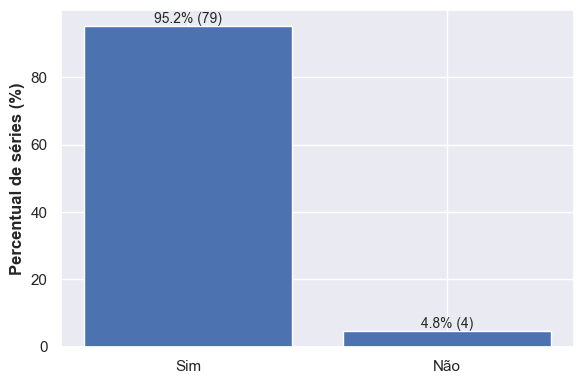

In [85]:
fig, ax = plot_stationarity_counts(adf_results)
fig.savefig("stationarity_counts.png", dpi=300, bbox_inches="tight")

In [87]:
# season_table = seasonality_summary(
#     df_total,                      # seu DataFrame
#     value_col="DL_bitrate",        # pode ser 'Throughput' se você renomeou
#     candidate_periods=(60, 300, 900)  # segundos: 1 min, 5 min, 15 min (ajuste conforme o caso)
# )

# season_table

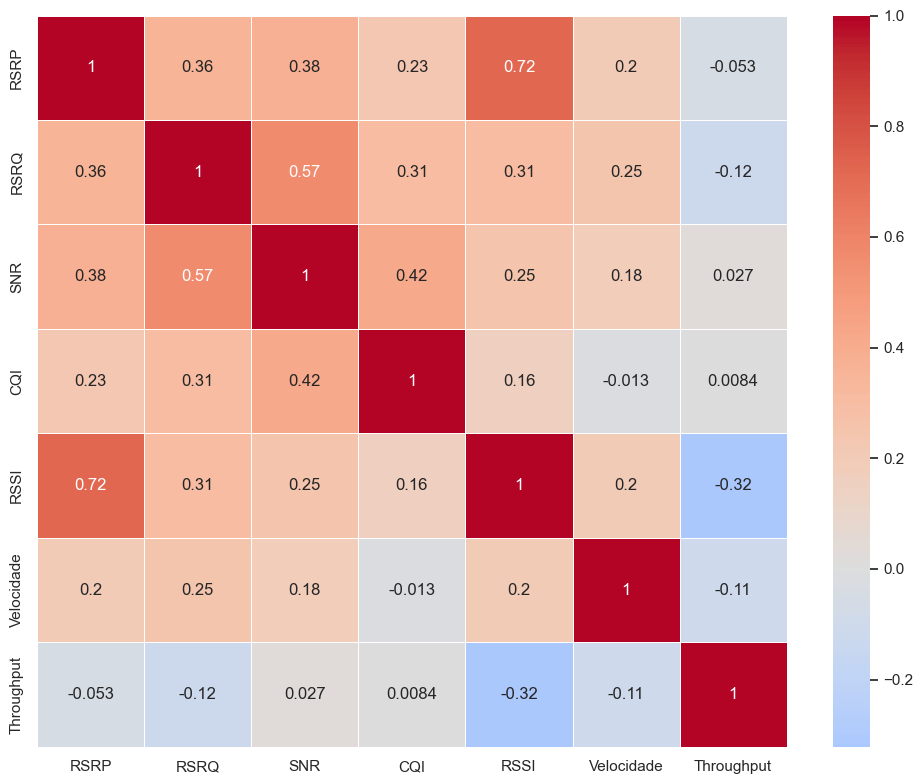

In [11]:
fig, ax = plot_pearson_correlation(df_total)
fig.savefig("pearson_corr_global.png", dpi=300, bbox_inches="tight")

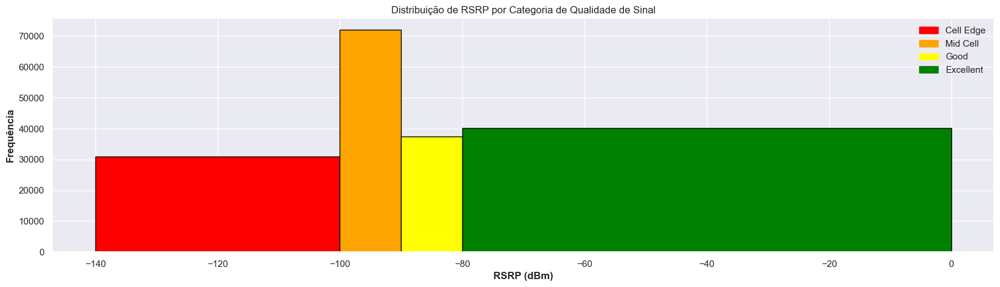

In [12]:
plot_rsrp_distribution(df_total)

Static vs Driving

In [13]:
df_total.source.unique()

array(['static_down_metrics', 'static_strm_metrics',
       'driving_down_metrics', 'driving_strm_metrics'], dtype=object)

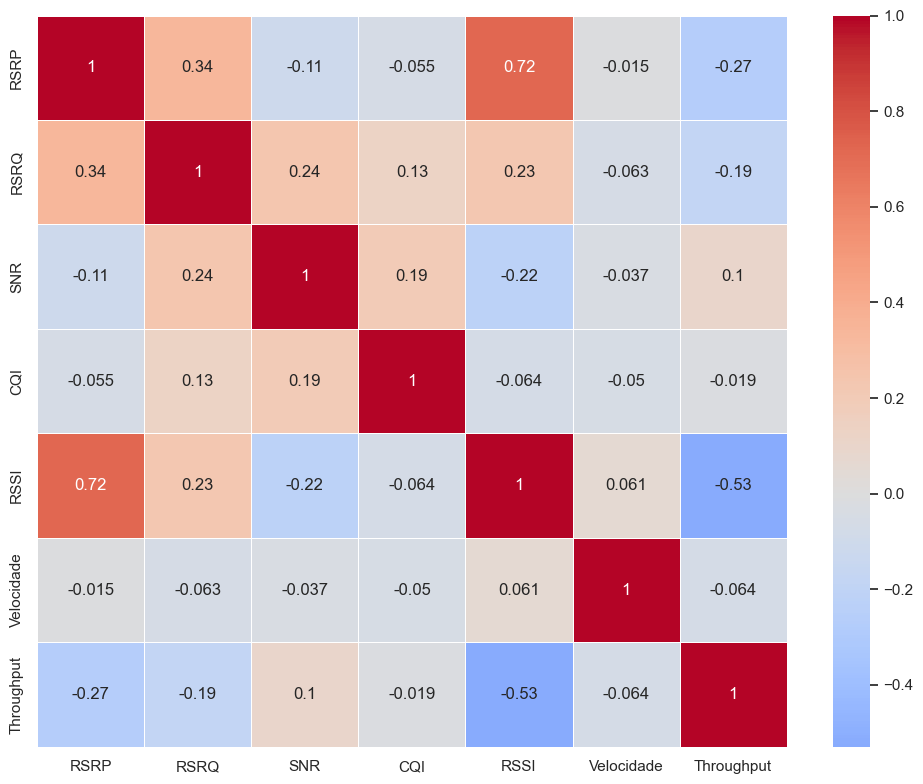

In [14]:
# Only static
fig, ax = plot_pearson_correlation(df_total.query("source in ['static_down_metrics', 'static_strm_metrics']"))
fig.savefig("pearson_corr_only_static.png", dpi=300, bbox_inches="tight")


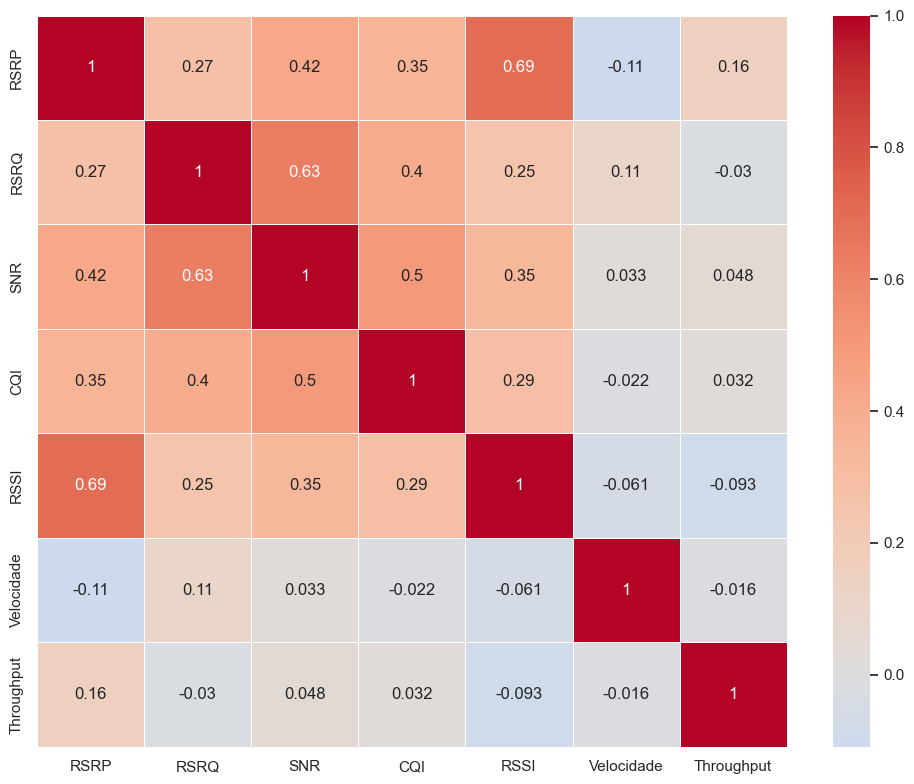

In [15]:
fig, ax = plot_pearson_correlation(df_total.query("source in ['driving_down_metrics', 'driving_strm_metrics']"))
fig.savefig("pearson_corr_only_driving.png", dpi=300, bbox_inches="tight")

### Static Downloading

In [57]:
df_total.query("source == 'static_down_metrics'")

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
0,trace_45,"[2019-12-16T13:40:04.000000, 2019-12-16T13:40:...","[-103.0, -102.0, -102.0, -104.0, -104.0, -104....","[-15.0, -16.0, -16.0, -14.0, -14.0, -14.0, -14...","[1.0, 7.0, 7.0, -7.0, -7.0, -7.0, 1.0, -3.0, -...","[15.0, 15.0, 15.0, 11.0, 11.0, 11.0, 11.0, 11....","[-90.0, -90.0, -90.0, -88.0, -88.0, -88.0, -88...","[0.072, 0.0, 0.0, 0.0, 0.0, 0.0, 27.631, 31.41...","[0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.138, 0.085, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
1,trace_46,"[2020-01-16T10:43:34.000000, 2020-01-16T10:43:...","[-99.0, -100.0, -100.0, -101.0, -101.0, -100.0...","[-10.0, -10.0, -10.0, -9.0, -9.0, -9.0, -9.0, ...","[9.0, 4.0, 4.0, 2.0, 2.0, 7.0, 7.0, 5.0, 5.0, ...","[14.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 14.0,...","[-107.0, -107.0, -105.0, -105.0, -105.0, -105....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 14.199...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 0.219,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
2,trace_47,"[2020-02-13T13:57:29.000000, 2020-02-13T13:57:...","[-101.0, -101.0, -102.0, -102.0, -102.0, -100....","[-15.0, -12.0, -11.0, -11.0, -11.0, -12.0, -12...","[4.0, 1.0, 1.0, 1.0, 1.0, -4.0, -4.0, -5.0, -5...","[11.0, 9.0, 9.0, 9.0, 9.0, 11.0, 11.0, 10.0, 1...","[-103.0, -103.0, -103.0, -103.0, -103.0, -103....","[0.169, 0.169, 0.166, 0.011, 0.011, 0.003, 4.5...","[0.129, 0.129, 0.232, 0.0, 0.0, 0.003, 0.111, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
3,trace_48,"[2020-02-14T13:21:26.000000, 2020-02-14T13:21:...","[-103.0, -103.0, -102.0, -103.0, -103.0, -104....","[-15.0, -15.0, -15.0, -16.0, -16.0, -16.0, -16...","[5.0, 5.0, 1.0, -2.0, -2.0, 2.0, 2.0, -4.0, -4...","[12.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 6.0, ...","[-107.0, -107.0, -107.0, -105.0, -109.0, -105....","[0.063, 0.002, 0.0, 0.002, 0.004, 20.568, 22.0...","[0.02, 0.004, 0.0, 0.004, 0.006, 0.254, 0.057,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
4,trace_49,"[2020-02-27T18:39:27.000000, 2020-02-27T18:39:...","[-101.0, -101.0, -101.0, -101.0, -101.0, -101....","[-10.0, -10.0, -10.0, -10.0, -12.0, -12.0, -10...","[0.0, 0.0, 8.0, 8.0, 3.0, 3.0, 4.0, 4.0, 8.0, ...","[12.0, 12.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12....","[-103.0, -103.0, -103.0, -103.0, -103.0, -101....","[0.012, 0.012, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.003, 0.003, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics


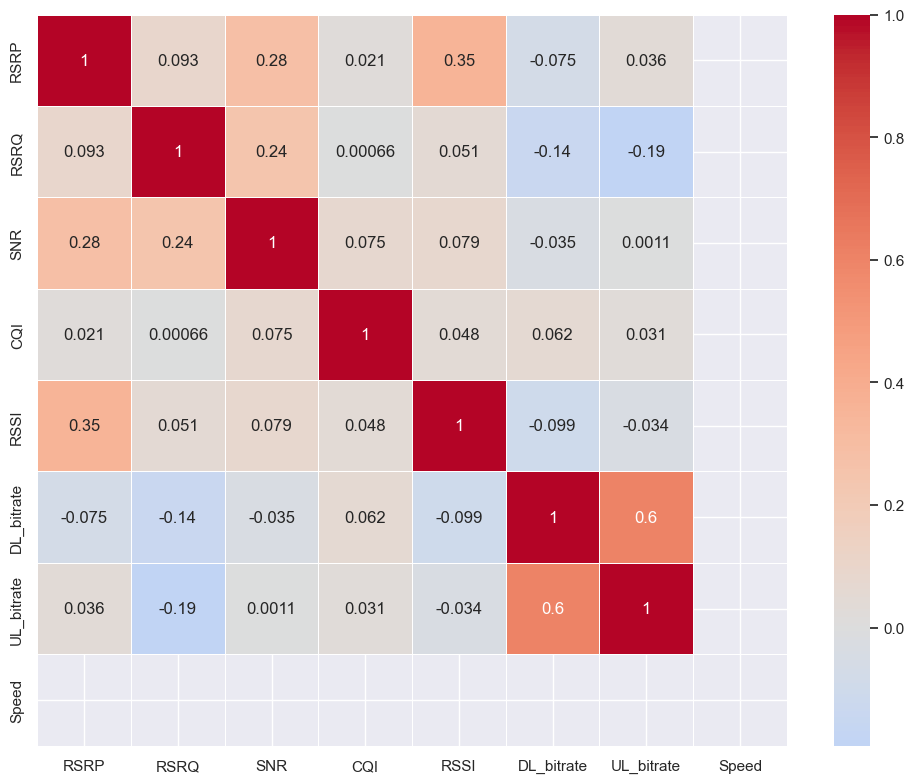

In [58]:
# plot_pearson_correlation(df_total.query("source == 'static_down_metrics'"))
fig, ax = plot_pearson_correlation(df_total.query("source == 'static_down_metrics'"))
fig.savefig("pearson_corr_static_down_metrics.png", dpi=300, bbox_inches="tight")

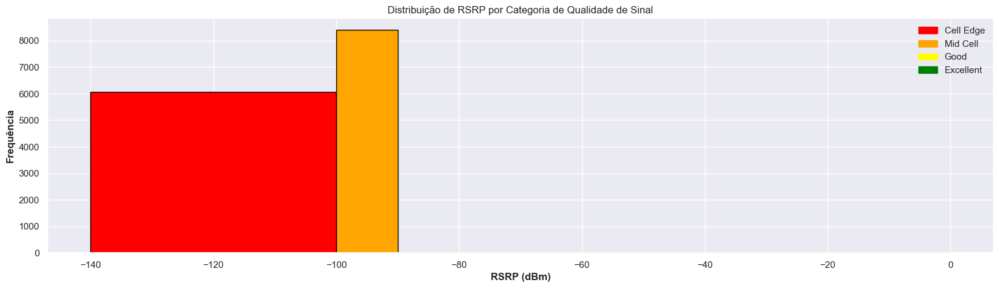

In [59]:
plot_rsrp_distribution(df_total.query("source == 'static_down_metrics'"))

In [60]:
df_total.query("source == 'static_down_metrics'")["DL_bitrate"]

0    [0.072, 0.0, 0.0, 0.0, 0.0, 0.0, 27.631, 31.41...
1    [0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 14.199...
2    [0.169, 0.169, 0.166, 0.011, 0.011, 0.003, 4.5...
3    [0.063, 0.002, 0.0, 0.002, 0.004, 20.568, 22.0...
4    [0.012, 0.012, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...
Name: DL_bitrate, dtype: object

In [61]:
# Plot Raw Pandas
# plot_splits_by_uid(df)

### Static Streaming

In [62]:
df_total.query("source == 'static_strm_metrics'").head(5)

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
5,trace_21,"[2020-01-06T09:55:14.000000, 2020-01-06T09:55:...","[-103.0, -102.0, -102.0, -102.0, -102.0, -101....","[-10.0, -10.0, -10.0, -9.0, -9.0, -11.0, -11.0...","[2.0, 2.0, 2.0, -1.0, -1.0, 3.0, 3.0, 2.0, 2.0...","[12.0, 11.0, 11.0, 10.0, 10.0, 12.0, 12.0, 11....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.0, 0.0, 0.0, 0.011, 0.993, 3.269, 2.415, 1....","[0.0, 0.0, 0.0, 0.0, 0.074, 0.37, 0.14, 0.064,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_strm_metrics
6,trace_22,"[2020-01-06T11:08:12.000000, 2020-01-06T11:08:...","[-98.0, -99.0, -102.0, -102.0, -97.0, -97.0, -...","[-14.0, -14.0, -10.0, -10.0, -10.0, -10.0, -11...","[12.0, 9.0, 5.0, 5.0, 14.0, 14.0, -7.0, -7.0, ...","[11.0, 12.0, 13.0, 13.0, 14.0, 14.0, 14.0, 14....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.0, 0.0, 0.0, 0.0, 2.851, 0.908, 1.168, 1.89...","[0.0, 0.0, 0.0, 0.0, 0.275, 0.034, 0.11, 0.114...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_strm_metrics
7,trace_23,"[2020-01-06T11:40:29.000000, 2020-01-06T11:40:...","[-100.0, -99.0, -97.0, -97.0, -97.0, -102.0, -...","[-10.0, -9.0, -10.0, -8.0, -8.0, -11.0, -11.0,...","[-6.0, 5.0, 14.0, -7.0, -7.0, 4.0, 4.0, -8.0, ...","[14.0, 14.0, 13.0, 10.0, 10.0, 12.0, 12.0, 10....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.16, 0.048, 0.142, 0.615, 0.461, 0.28, 0.075...","[0.626, 0.065, 0.112, 0.16, 0.379, 0.099, 0.03...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_strm_metrics
8,trace_24,"[2019-12-19T15:00:47.000000, 2019-12-19T15:00:...","[-104.0, -104.0, -104.0, -104.0, -105.0, -105....","[-15.0, -15.0, -14.0, -14.0, -12.0, -12.0, -14...","[-4.0, -4.0, -2.0, -2.0, 0.0, 0.0, 6.0, 6.0, 0...","[9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, ...","[-87.0, -87.0, -87.0, -87.0, -87.0, -87.0, -87...","[0.0, 0.0, 0.0, 0.0, 0.178, 0.0, 17.78, 2.282,...","[0.0, 0.0, 0.0, 0.0, 0.128, 0.0, 0.574, 0.069,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_strm_metrics
9,trace_25,"[2019-12-23T10:30:35.000000, 2019-12-23T10:30:...","[-100.0, -100.0, -105.0, -105.0, -102.0, -102....","[-10.0, -10.0, -15.0, -15.0, -13.0, -13.0, -10...","[1.0, 1.0, 0.0, 0.0, -1.0, -1.0, -2.0, -2.0, 4...","[10.0, 10.0, 10.0, 12.0, 12.0, 13.0, 13.0, 13....","[nan, nan, nan, nan, nan, nan, nan, nan, -84.0...","[0.165, 0.094, 0.001, 0.035, 0.001, 0.0, 3.798...","[0.055, 0.018, 0.002, 0.01, 0.001, 0.0, 0.308,...","[0.0, 0.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, ...",static_strm_metrics


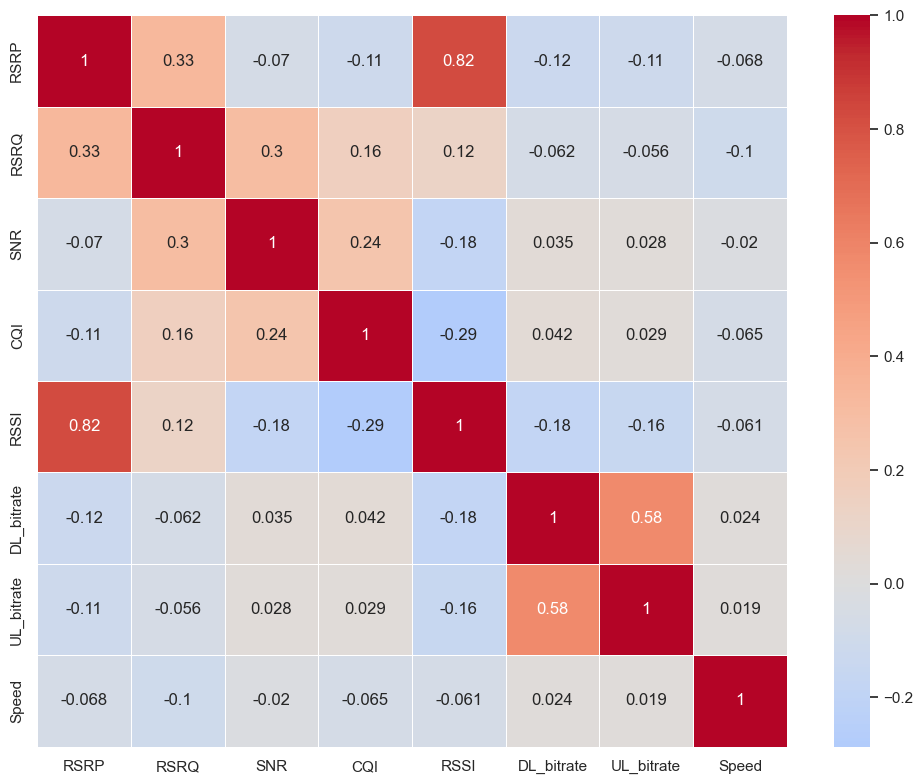

(<Figure size 1000x800 with 2 Axes>, <Axes: >)

In [63]:
plot_pearson_correlation(df_total.query("source == 'static_strm_metrics'"))

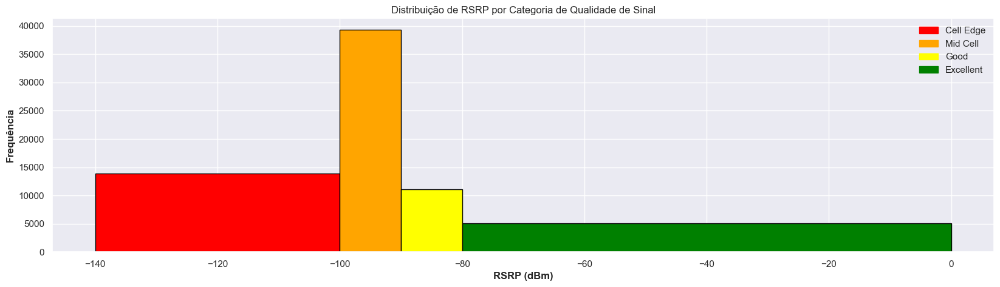

In [64]:
plot_rsrp_distribution(df_total.query("source == 'static_strm_metrics'"))

In [65]:
# plot_splits_by_uid(df)

### Driving Downloading

In [66]:
df_total.query("source == 'driving_down_metrics'").head(5)

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
23,trace_29,"[2019-12-14T10:16:30.000000, 2019-12-14T10:16:...","[-99.0, -99.0, -102.0, -102.0, -102.0, -102.0,...","[-15.0, -15.0, -14.0, -14.0, -14.0, -14.0, -13...","[6.0, 6.0, 6.0, 6.0, 4.0, 4.0, 4.0, 4.0, 4.0, ...","[12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12....","[-90.0, -90.0, -90.0, -90.0, -90.0, -90.0, -90...","[0.007, 0.007, 0.0, 0.009, 0.0, 0.0, 0.0, 0.0,...","[0.001, 0.001, 0.0, 0.012, 0.0, 0.0, 0.0, 0.0,...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_down_metrics
24,trace_30,"[2019-12-16T07:22:43.000000, 2019-12-16T07:22:...","[-98.0, -99.0, -99.0, -99.0, -101.0, -101.0, -...","[-10.0, -9.0, -10.0, -10.0, -10.0, -10.0, -10....","[3.0, 9.0, 4.0, 4.0, 7.0, 7.0, 6.0, 6.0, 6.0, ...","[12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12....","[-88.0, -88.0, -88.0, -88.0, -88.0, -88.0, -88...","[0.222, 0.008, 0.0, 0.035, 0.0, 0.0, 0.0, 0.14...","[0.053, 0.002, 0.0, 0.01, 0.0, 0.0, 0.0, 0.094...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_down_metrics
25,trace_31,"[2019-12-16T11:49:59.000000, 2019-12-16T11:50:...","[-91.0, -91.0, -91.0, -91.0, -91.0, -89.0, -89...","[-2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2.0, -2....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.022, 0.072, 0.106, 0.01, 0.006, 1.034, 1.99...","[0.036, 0.021, 0.02, 0.005, 0.003, 0.04, 0.046...","[0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, ...",driving_down_metrics
26,trace_32,"[2019-12-16T12:27:05.000000, 2019-12-16T12:27:...","[-100.0, -100.0, -99.0, -99.0, -100.0, -100.0,...","[-11.0, -11.0, -11.0, -11.0, -12.0, -12.0, -12...","[5.0, 5.0, 3.0, 3.0, 1.0, 1.0, 6.0, 6.0, 6.0, ...","[12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 9.0, 9.0,...","[-90.0, -90.0, -90.0, -90.0, -90.0, -90.0, -92...","[0.03, 0.03, 0.0, 0.009, 0.0, 0.0, 24.925, 16....","[0.008, 0.008, 0.0, 0.012, 0.001, 0.001, 0.198...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_down_metrics
27,trace_33,"[2019-12-16T14:23:32.000000, 2019-12-16T14:23:...","[-92.0, -93.0, -95.0, -95.0, -95.0, -93.0, -93...","[-19.0, -19.0, -17.0, -17.0, -17.0, -20.0, -18...","[-11.0, -11.0, -8.0, -8.0, -8.0, -12.0, -8.0, ...","[8.0, 5.0, 11.0, 11.0, 10.0, 9.0, 8.0, 8.0, 12...","[-85.0, -75.0, -78.0, -78.0, -81.0, -83.0, -85...","[0.1, 0.098, 0.0, 0.036, 0.002, 118.778, 221.2...","[0.066, 0.036, 0.0, 0.011, 0.002, 1.228, 0.258...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_down_metrics


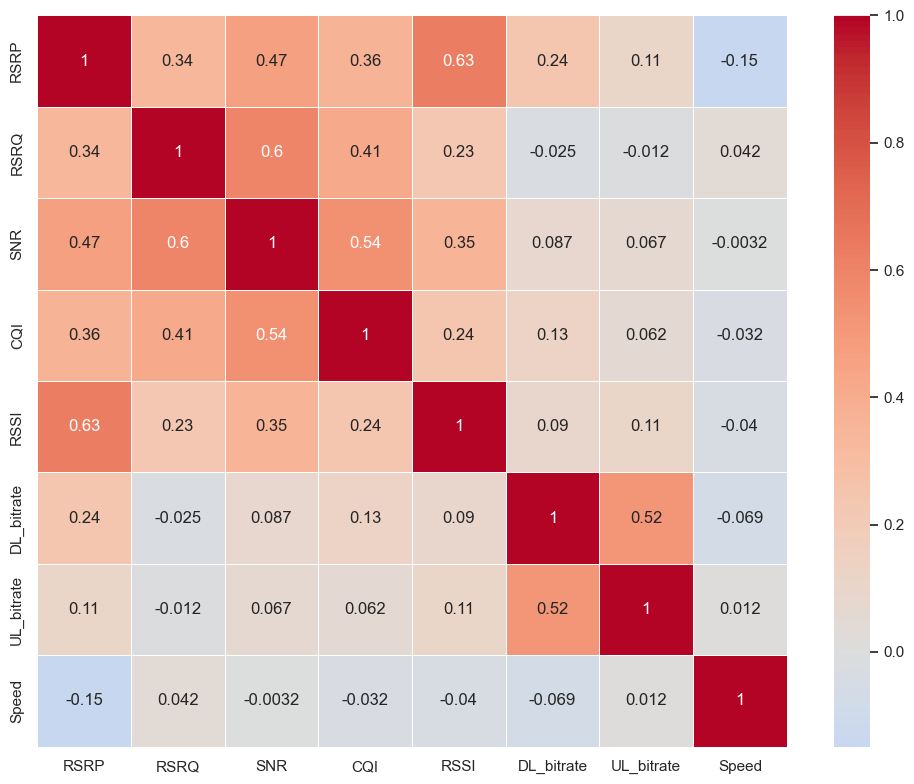

(<Figure size 1000x800 with 2 Axes>, <Axes: >)

In [67]:
plot_pearson_correlation(df_total.query("source == 'driving_down_metrics'"))

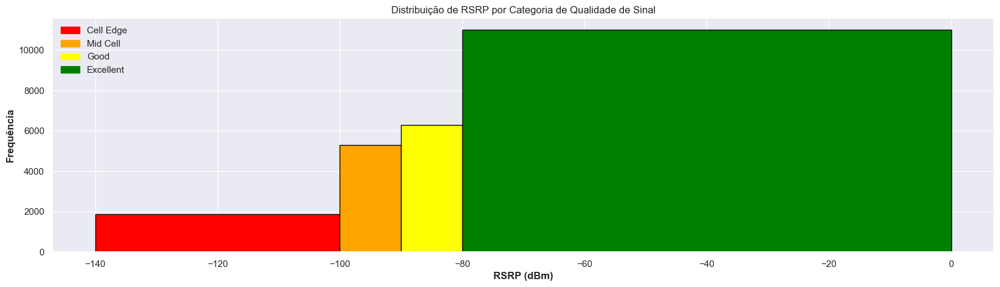

In [68]:
plot_rsrp_distribution(df_total.query("source == 'driving_down_metrics'"))

In [69]:
# plot_splits_by_uid(df)

### Driving Streaming

In [70]:
df_total.query("source == 'driving_strm_metrics'").head(5)

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
39,trace_0,"[2019-11-28T07:27:57.000000, 2019-11-28T07:27:...","[-102.0, -102.0, -102.0, -102.0, -103.0, -103....","[-10.0, -10.0, -10.0, -10.0, -11.0, -11.0, -11...","[8.0, 8.0, 3.0, 3.0, 6.0, 6.0, 1.0, 1.0, 8.0, ...","[14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14.0, 14....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.0, 0.0, 0.003, 0.009, 0.926, 2.814, 0.0, 1....","[0.0, 0.002, 0.002, 0.013, 0.093, 0.146, 0.0, ...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_strm_metrics
40,trace_1,"[2019-11-28T10:14:25.000000, 2019-11-28T10:14:...","[-89.0, -89.0, -90.0, -90.0, -89.0, -89.0, -89...","[-10.0, -10.0, -9.0, -9.0, -15.0, -15.0, -11.0...","[-3.0, -3.0, 7.0, 7.0, 5.0, 5.0, 6.0, 6.0, 5.0...","[11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11.0, 11....","[-70.0, -70.0, -70.0, -70.0, -70.0, -70.0, -70...","[0.0, 0.0, 0.0, 0.004, 0.0, 0.0, 0.0, 0.0, 0.0...","[0.0, 0.0, 0.0, 0.005, 0.0, 0.0, 0.0, 0.0, 0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_strm_metrics
41,trace_2,"[2019-11-28T12:05:30.000000, 2019-11-28T12:05:...","[-100.0, -100.0, -100.0, -101.0, -101.0, -100....","[-10.0, -10.0, -10.0, -11.0, -11.0, -11.0, -11...","[1.0, -1.0, -1.0, -7.0, -7.0, 7.0, 7.0, 4.0, 4...","[11.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13....","[-84.0, nan, nan, nan, nan, nan, nan, nan, nan...","[0.027, 0.0, 0.035, 0.867, 2.198, 0.0, 1.824, ...","[0.008, 0.0, 0.01, 0.187, 0.042, 0.009, 0.186,...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_strm_metrics
42,trace_3,"[2019-11-28T14:53:29.000000, 2019-11-28T14:53:...","[-99.0, -99.0, -98.0, -98.0, -98.0, -98.0, -98...","[-19.0, -19.0, -18.0, -18.0, -17.0, -17.0, -17...","[-6.0, -6.0, -9.0, -9.0, -1.0, -1.0, -5.0, -5....","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[-88.0, -88.0, -88.0, -88.0, -88.0, -88.0, -86...","[0.011, 0.011, 0.0, 0.085, 14.591, 4.704, 0.01...","[0.003, 0.003, 0.0, 0.025, 0.503, 0.121, 0.013...","[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",driving_strm_metrics
43,trace_4,"[2019-11-28T17:18:56.000000, 2019-11-28T17:18:...","[-101.0, -102.0, -102.0, -102.0, -102.0, -102....","[-11.0, -13.0, -13.0, -13.0, -11.0, -12.0, -12...","[5.0, 3.0, 3.0, 3.0, 7.0, 8.0, 8.0, 8.0, 8.0, ...","[12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12....","[-85.0, -85.0, -85.0, -85.0, -85.0, -85.0, -85...","[0.177, 0.032, 0.003, 0.003, 0.678, 2.774, 0.0...","[0.042, 0.007, 0.007, 0.007, 0.067, 0.263, 0.0...","[0.0, 0.0, 0.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, ...",driving_strm_metrics


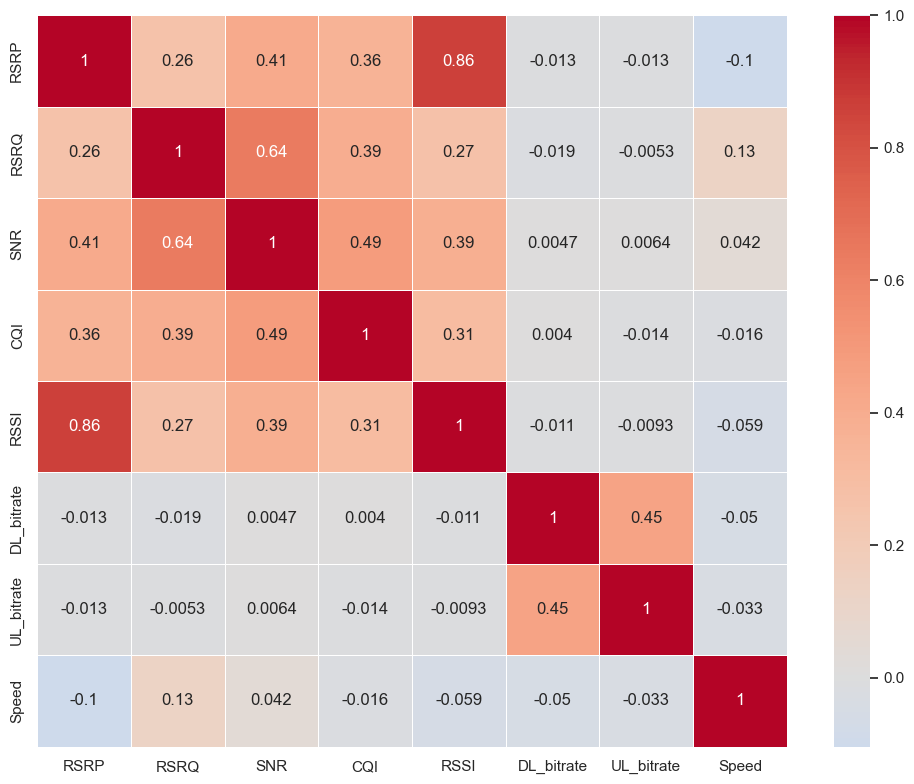

(<Figure size 1000x800 with 2 Axes>, <Axes: >)

In [71]:
plot_pearson_correlation(df_total.query("source == 'driving_strm_metrics'"))

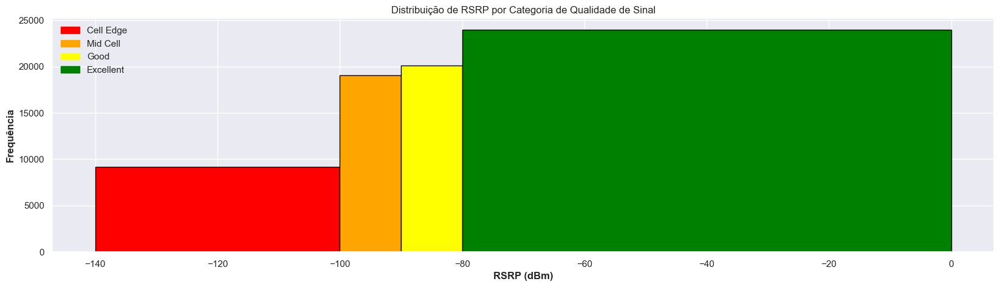

In [72]:
plot_rsrp_distribution(df_total.query("source == 'driving_strm_metrics'"))

In [73]:
# plot_splits_by_uid(df)

# Analisando o comportamento das séries

## Augmented Dickey-Fuller Test

In [74]:
# from pipeline_5g.utils.timeseries import split_and_impute_timeseries_on_gaps

In [75]:
df_total

,Uid,Timestamp,RSRP,RSRQ,SNR,CQI,RSSI,DL_bitrate,UL_bitrate,Speed,source
0,trace_45,"[2019-12-16T13:40:04.000000, 2019-12-16T13:40:...","[-103.0, -102.0, -102.0, -104.0, -104.0, -104....","[-15.0, -16.0, -16.0, -14.0, -14.0, -14.0, -14...","[1.0, 7.0, 7.0, -7.0, -7.0, -7.0, 1.0, -3.0, -...","[15.0, 15.0, 15.0, 11.0, 11.0, 11.0, 11.0, 11....","[-90.0, -90.0, -90.0, -88.0, -88.0, -88.0, -88...","[0.072, 0.0, 0.0, 0.0, 0.0, 0.0, 27.631, 31.41...","[0.02, 0.0, 0.0, 0.0, 0.0, 0.0, 0.138, 0.085, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
1,trace_46,"[2020-01-16T10:43:34.000000, 2020-01-16T10:43:...","[-99.0, -100.0, -100.0, -101.0, -101.0, -100.0...","[-10.0, -10.0, -10.0, -9.0, -9.0, -9.0, -9.0, ...","[9.0, 4.0, 4.0, 2.0, 2.0, 7.0, 7.0, 5.0, 5.0, ...","[14.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 14.0,...","[-107.0, -107.0, -105.0, -105.0, -105.0, -105....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 14.199...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.002, 0.002, 0.219,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
2,trace_47,"[2020-02-13T13:57:29.000000, 2020-02-13T13:57:...","[-101.0, -101.0, -102.0, -102.0, -102.0, -100....","[-15.0, -12.0, -11.0, -11.0, -11.0, -12.0, -12...","[4.0, 1.0, 1.0, 1.0, 1.0, -4.0, -4.0, -5.0, -5...","[11.0, 9.0, 9.0, 9.0, 9.0, 11.0, 11.0, 10.0, 1...","[-103.0, -103.0, -103.0, -103.0, -103.0, -103....","[0.169, 0.169, 0.166, 0.011, 0.011, 0.003, 4.5...","[0.129, 0.129, 0.232, 0.0, 0.0, 0.003, 0.111, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
3,trace_48,"[2020-02-14T13:21:26.000000, 2020-02-14T13:21:...","[-103.0, -103.0, -102.0, -103.0, -103.0, -104....","[-15.0, -15.0, -15.0, -16.0, -16.0, -16.0, -16...","[5.0, 5.0, 1.0, -2.0, -2.0, 2.0, 2.0, -4.0, -4...","[12.0, 12.0, 12.0, 10.0, 10.0, 9.0, 9.0, 6.0, ...","[-107.0, -107.0, -107.0, -105.0, -109.0, -105....","[0.063, 0.002, 0.0, 0.002, 0.004, 20.568, 22.0...","[0.02, 0.004, 0.0, 0.004, 0.006, 0.254, 0.057,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
4,trace_49,"[2020-02-27T18:39:27.000000, 2020-02-27T18:39:...","[-101.0, -101.0, -101.0, -101.0, -101.0, -101....","[-10.0, -10.0, -10.0, -10.0, -12.0, -12.0, -10...","[0.0, 0.0, 8.0, 8.0, 3.0, 3.0, 4.0, 4.0, 8.0, ...","[12.0, 12.0, 13.0, 13.0, 12.0, 12.0, 12.0, 12....","[-103.0, -103.0, -103.0, -103.0, -103.0, -101....","[0.012, 0.012, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.003, 0.003, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",static_down_metrics
...,...,...,...,...,...,...,...,...,...,...,...
78,trace_68,"[2019-11-26T13:00:56.000000, 2019-11-26T13:00:...","[-97.0, -99.0, -99.0, -99.0, -99.0, -99.0, -99...","[-9.0, -10.0, -10.0, -10.0, -10.0, -10.0, -10....","[14.0, 3.0, 3.0, 5.0, 5.0, 11.0, 11.0, 5.0, 5....","[12.0, 12.0, 12.0, 11.0, 11.0, 11.0, 11.0, 11....","[-86.0, -88.0, -88.0, -86.0, -86.0, -86.0, -86...","[0.17, 0.038, 0.035, 0.0, 0.079, 12.0, 31.224,...","[0.42, 0.012, 0.01, 0.0, 0.02, 0.73, 1.0, 0.99...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_strm_metrics
79,trace_69,"[2019-11-26T13:20:43.000000, 2019-11-26T13:20:...","[-76.0, -76.0, -75.0, -75.0, -75.0, -75.0, -76...","[-10.0, -10.0, -8.0, -8.0, -9.0, -9.0, -8.0, -...","[22.0, 22.0, 24.0, 24.0, 27.0, 27.0, 21.0, 21....","[15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15.0, 15....","[nan, nan, nan, nan, nan, nan, nan, -56.0, -56...","[0.056, 0.0, 0.0, 0.117, 18.082, 33.135, 38.20...","[0.019, 0.0, 0.0, 0.043, 1.039, 1.016, 1.168, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",driving_strm_metrics
80,trace_70,"[2019-11-26T15:02:50.000000, 2019-11-26T15:02:...","[-90.0, -91.0, -92.0, -92.0, -93.0, -93.0, -92...","[-13.0, -15.0, -15.0, -15.0, -16.0, -16.0, -15...","[4.0, 3.0, 2.0, 2.0, 0.0, 0.0, 1.0, 1.0, 0.0, ...","[13.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10....","[-73.0, -75.0, nan, nan, nan, nan, nan, nan, n...","[0.001, 0.035, 0.0, 0.049, 0.822, 11.256, 13.9...","[0.00

In [76]:
from pipeline_5g.utils import create_target_timeseries, create_covariates_timeseries, impute_timeseries_missing_values

In [ ]:
# Definições
target_col = ["DL_bitrate"]
covariates = ["RSRP", "RSRQ", "SNR", "CQI", "RSSI", "Speed"]

linhas = []  # iremos acumular dataframes já normalizados por Uid/Timestamp

print("[INFO] Gerando séries temporais...")
for idx, row in df_total.iterrows():
    try:
        # Recriar o DataFrame a partir das listas na linha
        ts_df_data = {col: row[col] for col in row.index if col not in ['Uid', 'source']}
        ts_df = pd.DataFrame(ts_df_data)

        # Cria séries de alvo e covariáveis (Darts TimeSeries, presumivelmente)
        target_ts = create_target_timeseries(ts_df, target_col, timestamp_col="Timestamp")
        cov_ts    = create_covariates_timeseries(ts_df, covariates, timestamp_col="Timestamp")

        print(f"[INFO] Imputando valores ausentes em {row['Uid']}")
        target_ts = impute_timeseries_missing_values(target_ts)
        cov_ts    = impute_timeseries_missing_values(cov_ts)

        # Converte para DataFrame do pandas
        # Darts fornece .pd_dataframe() com o time_index como index
        target_df = target_ts.pd_dataframe()      # colunas = target_col
        cov_df    = cov_ts.pd_dataframe()         # colunas = covariates

        df_join = target_df.join(cov_df, how="outer")

        # Garante nome do índice como 'Timestamp' e reseta para coluna
        df_join.index.name = "Timestamp"
        df_join = df_join.reset_index()

        # Anexa Uid
        df_join.insert(0, "Uid", row["Uid"])

        # (opcional) ordena temporalmente
        df_join = df_join.sort_values(["Uid", "Timestamp"])

        linhas.append(df_join)

    except Exception as e:
        print(f"[WARNING] Erro na linha {idx}: {e}")
        continue

print(f"[INFO] Séries temporais processadas com sucesso: {len(linhas)}")

# Salvando resultados em formato longo (1 linha por Uid-Timestamp)
final_df = pd.concat(linhas, ignore_index=True)

# Garante dtypes adequados
final_df["Timestamp"] = pd.to_datetime(final_df["Timestamp"], utc=False)


# # Salva em Parquet; particionar por Uid ajuda a ler por traço e reduz I/O
# output_path = os.path.join("processed_timeseries_test.parquet")
# final_df.to_parquet(output_path, engine="pyarrow")  # pode usar partition_cols=['Uid'] se quiser múltiplos arquivos

[INFO] Gerando séries temporais...
[INFO] Imputando valores ausentes em trace_45
[INFO] Imputando valores ausentes em trace_46
[INFO] Imputando valores ausentes em trace_47
[INFO] Imputando valores ausentes em trace_48
[INFO] Imputando valores ausentes em trace_49
[INFO] Imputando valores ausentes em trace_21
[INFO] Imputando valores ausentes em trace_22
[INFO] Imputando valores ausentes em trace_23
[INFO] Imputando valores ausentes em trace_24
[INFO] Imputando valores ausentes em trace_25
[INFO] Imputando valores ausentes em trace_26
[INFO] Imputando valores ausentes em trace_27
[INFO] Imputando valores ausentes em trace_28
[INFO] Imputando valores ausentes em trace_73
[INFO] Imputando valores ausentes em trace_74
[INFO] Imputando valores ausentes em trace_75
[INFO] Imputando valores ausentes em trace_76
[INFO] Imputando valores ausentes em trace_77
[INFO] Imputando valores ausentes em trace_78
[INFO] Imputando valores ausentes em trace_79
[INFO] Imputando valores ausentes em trace_80

In [102]:
final_df.head(5)

component,Uid,Timestamp,DL_bitrate,RSRP,RSRQ,SNR,CQI,RSSI,Speed
0,trace_45,2019-12-16 13:40:04,0.072,-103.0,-15.0,1.0,15.0,-90.0,0.0
1,trace_45,2019-12-16 13:40:05,0.000,-102.0,-16.0,7.0,15.0,-90.0,0.0
2,trace_45,2019-12-16 13:40:06,0.000,-102.0,-16.0,7.0,15.0,-90.0,0.0
3,trace_45,2019-12-16 13:40:07,0.000,-104.0,-14.0,-7.0,11.0,-88.0,0.0
4,trace_45,2019-12-16 13:40:08,0.000,-104.0,-14.0,-7.0,11.0,-88.0,0.0


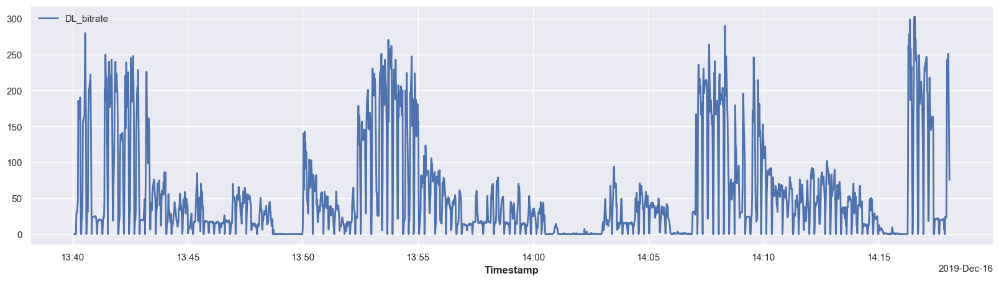

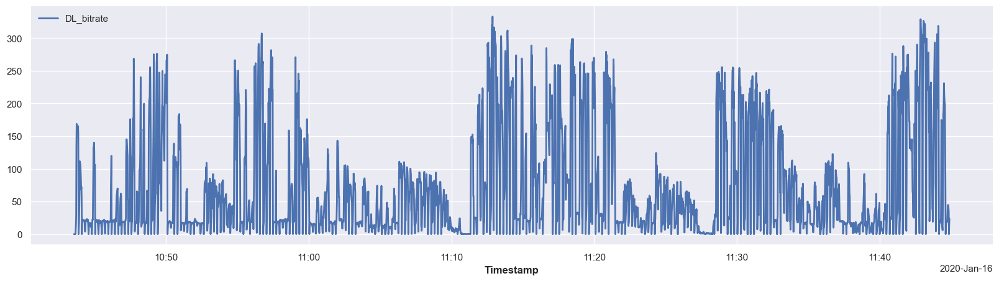

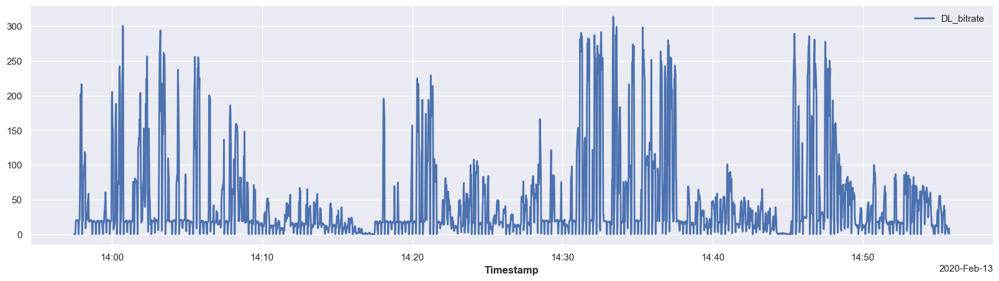

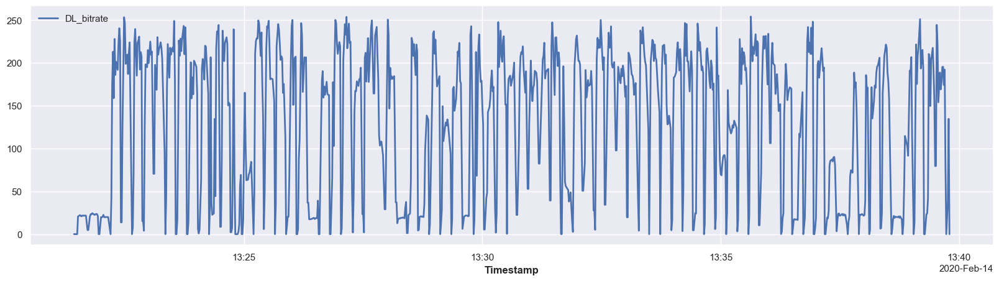

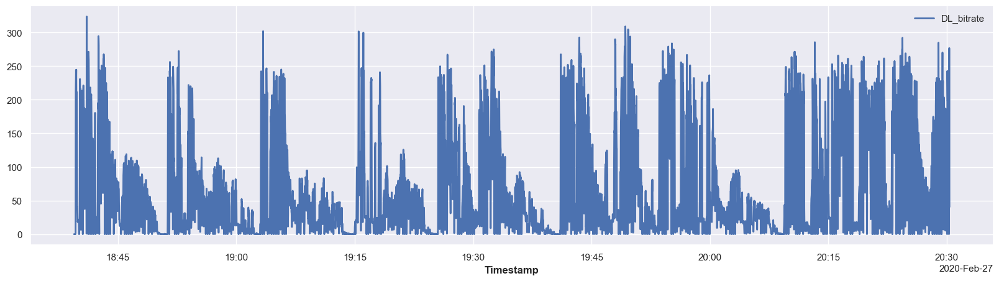

...

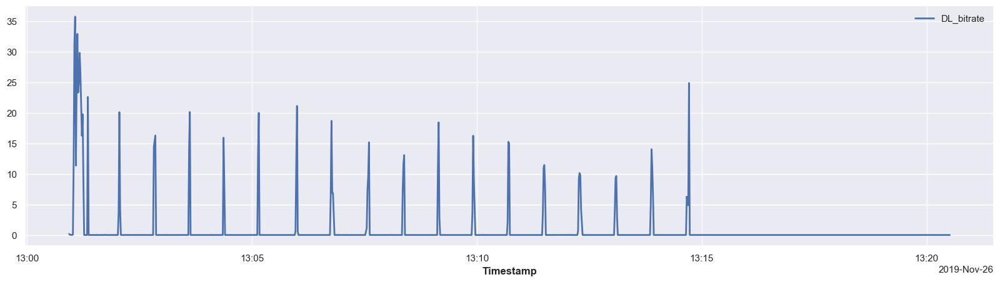

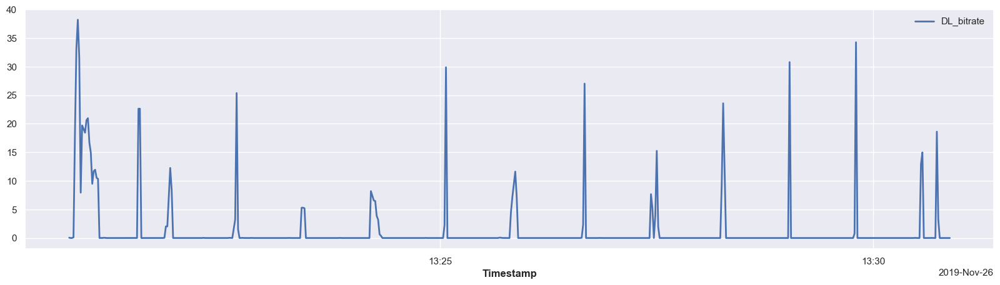

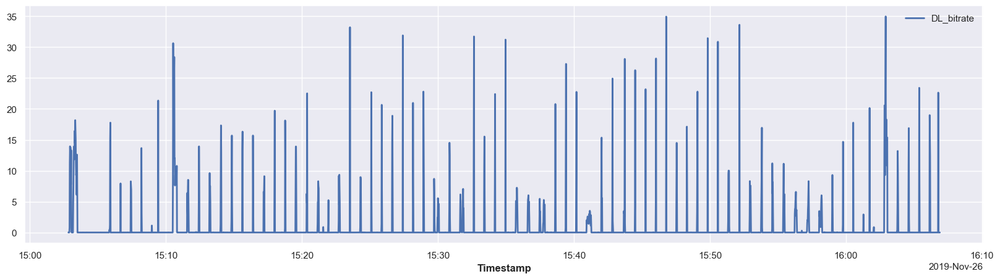

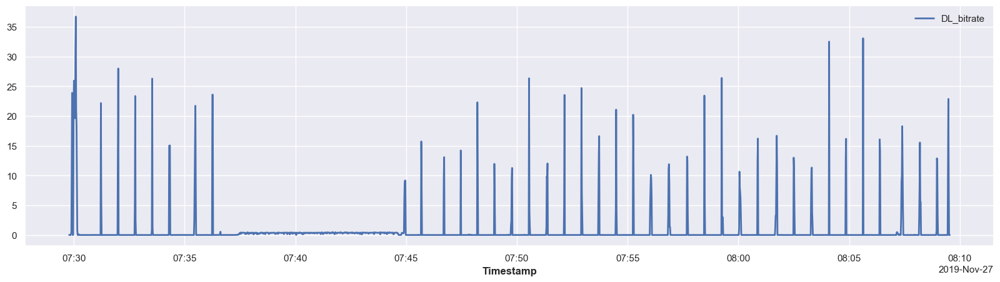

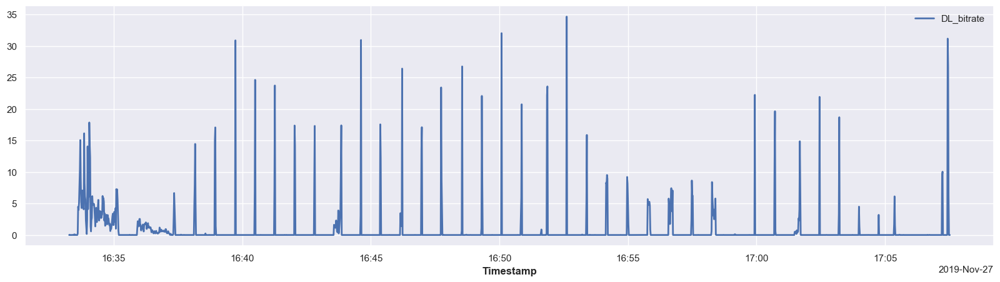

In [ ]:
for i in final_df.Uid.unique():
    ts_test = final_df.query(f"Uid == '{i}' ")[["Timestamp","DL_bitrate"]]
    TimeSeries.from_dataframe(ts_test, time_col="Timestamp", value_cols=["DL_bitrate"]).plot()
    plt.show()


Uid                                                           trace_45
Targets_idx          DatetimeIndex(['2019-12-16 13:40:04', '2019-12...
Targets_values       [[0.072], [0.0], [0.0], [0.0], [0.0], [0.0], [...
Covariates_idx       DatetimeIndex(['2019-12-16 13:40:04', '2019-12...
Covariates_values    [[-103.0, -15.0, 1.0, 15.0, -90.0, 0.0], [-102...
Name: 0, dtype: object

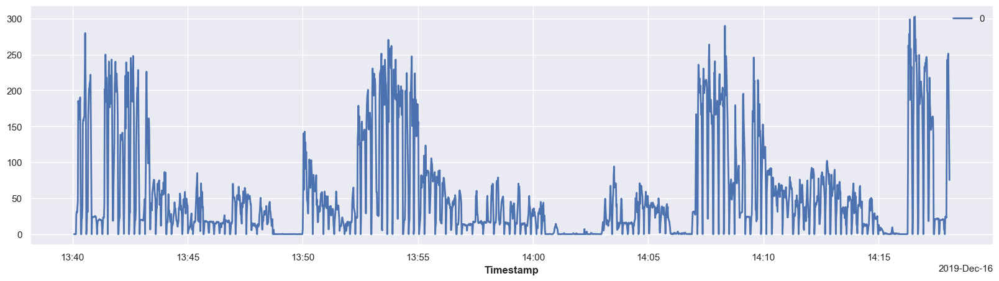

In [ ]:
# for i, row in export_all.iterrows():
#     display(row)
#     TimeSeries.from_times_and_values(row["Targets_idx"], row["Targets_values"]).plot()
#     break


Trace trace_45


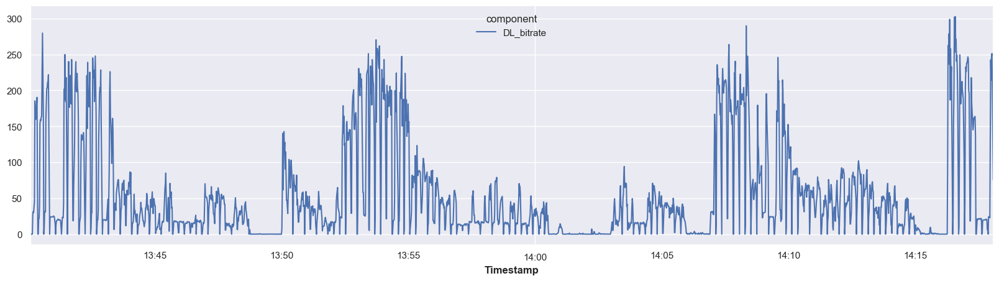

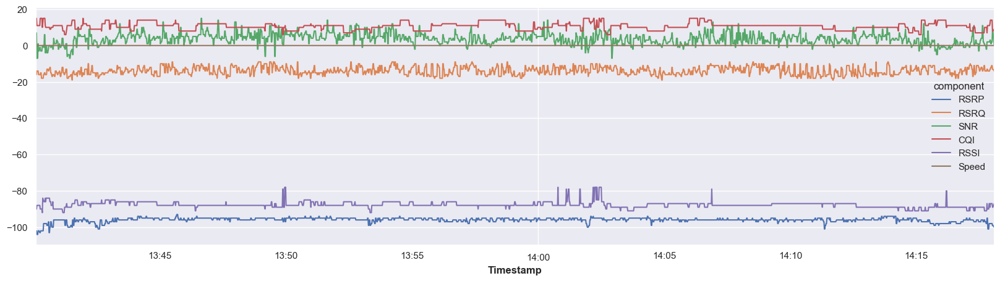

In [ ]:
for i in range(len(export_all)):
    print(f"Trace {traces_uid[i]}")
    targets[i].plot()
    covariates_ts[i].plot()
    plt.show()
    break

<Axes: xlabel='Timestamp'>

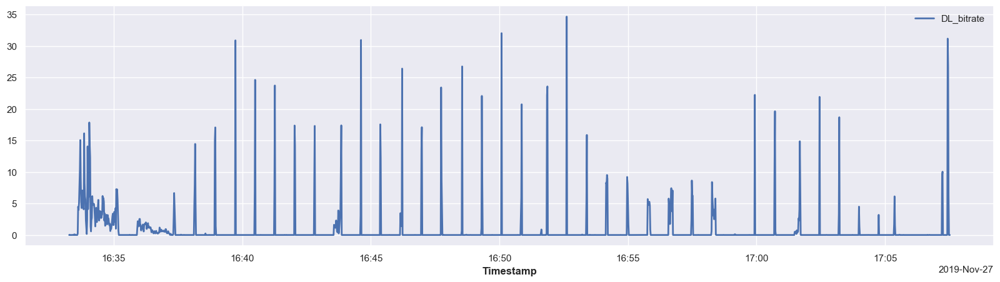

In [79]:
impute_timeseries_missing_values(target_ts).plot()

In [80]:
impute_timeseries_missing_values(past_cov_ts).plot()

NameError: name 'past_cov_ts' is not defined

<Axes: xlabel='timestamp'>

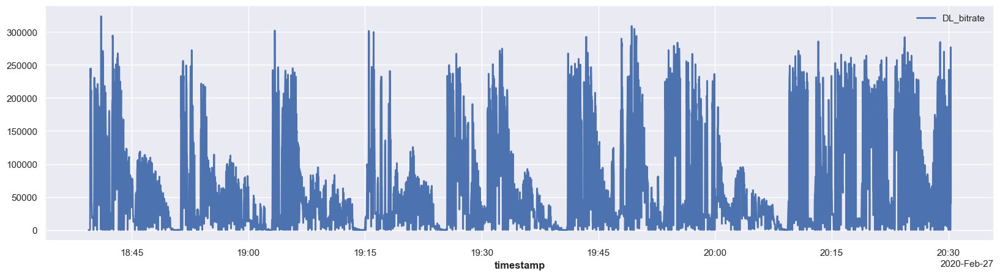

In [ ]:
all_targets[3].plot()

<Axes: xlabel='timestamp'>

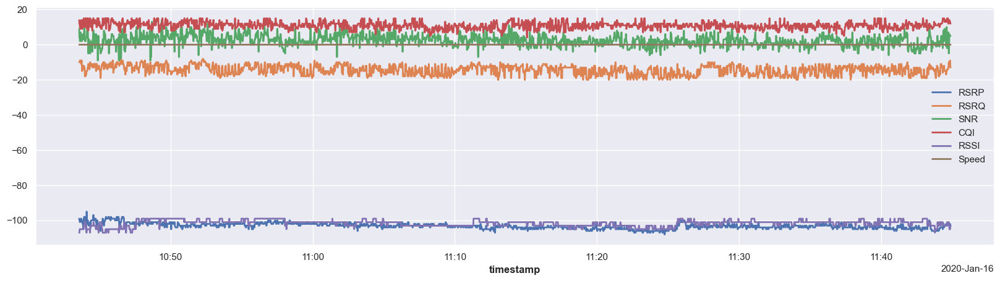

In [ ]:
all_past_covariates[2].plot()

In [ ]:
# from darts.utils.statistics import plot_acf, plot_pacf
# import matplotlib.pyplot as plt

# # A função irá plotar para no máximo 'max_series' (default 10)
# plot_acf(all_targets, m=None, max_lag=24, alpha=0.05)
# plt.suptitle("ACF para um subconjunto de Séries Alvo")
# plt.show()

# plot_pacf(all_targets, m=None, max_lag=24, alpha=0.05)
# plt.suptitle("PACF para um subconjunto de Séries Alvo")
# plt.show()

In [ ]:
# processed_series = []
# for idx, row in df_total.iterrows():
#     subseries = split_and_impute_timeseries_on_gaps(
#         row, "DL_bitrate"
#     )
#     if subseries:
#         processed_series.extend(subseries)

<Axes: xlabel='timestamp'>

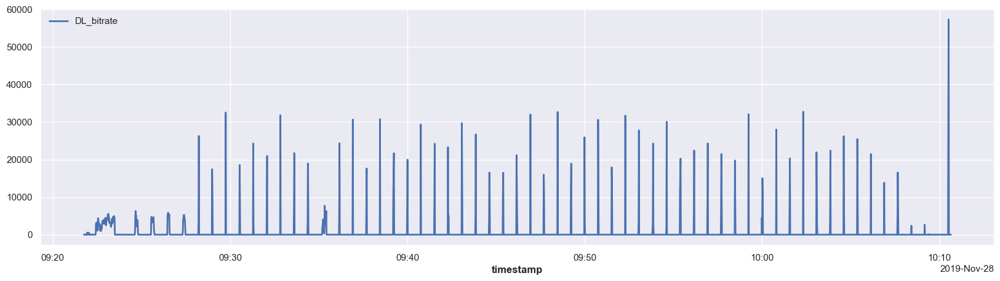

In [ ]:
# Plot Timeseries processed
all_targets[7].plot()

In [ ]:
for idx, serie in enumerate(all_targets):
    print(f"--- Series {idx} ---")
    adf_test(serie.pd_dataframe())

--- Series 0 ---
Augmented Dickey-Fuller Test: 
ADF test statistic     -8.025701e+00
p-value                 2.020190e-12
# lags used             2.800000e+01
# observations          3.469000e+03
critical value (1%)    -3.432236e+00
critical value (5%)    -2.862374e+00
critical value (10%)   -2.567214e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
--- Series 1 ---
Augmented Dickey-Fuller Test: 
ADF test statistic     -6.929508e+00
p-value                 1.093285e-09
# lags used             1.500000e+01
# observations          1.087000e+03
critical value (1%)    -3.436380e+00
critical value (5%)    -2.864203e+00
critical value (10%)   -2.568188e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
--- Series 2 ---
Augmented Dickey-Fuller Test: 
ADF test statistic     -5.956258e+00
p-value                 2.089818e-07
# lags used             3.000000e+01
# obs

## Autocorrelation

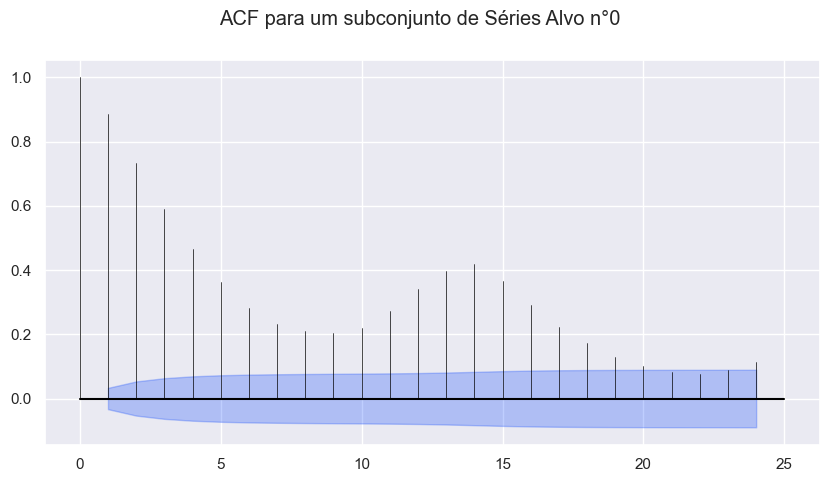

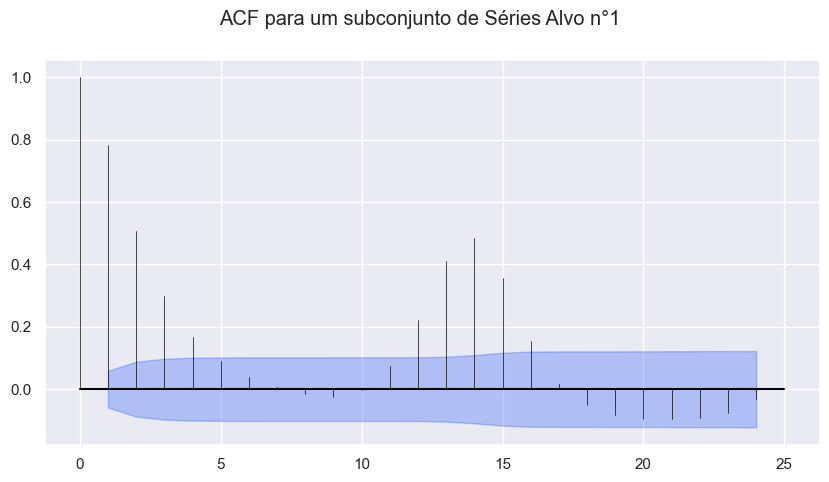

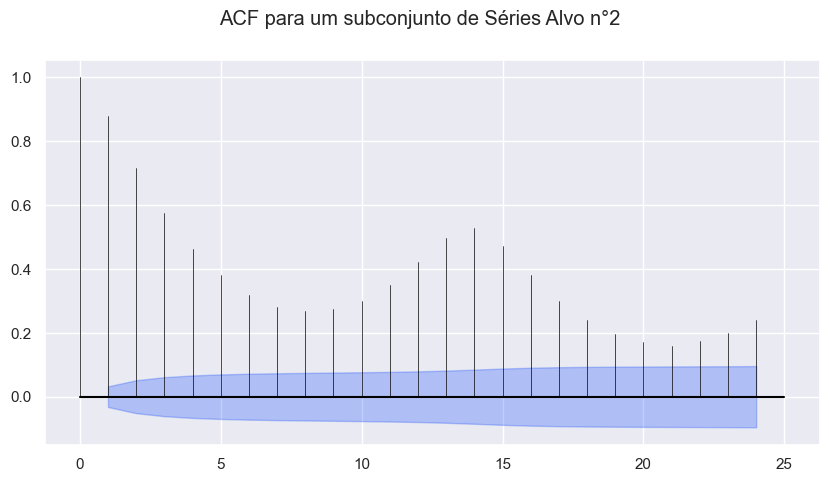

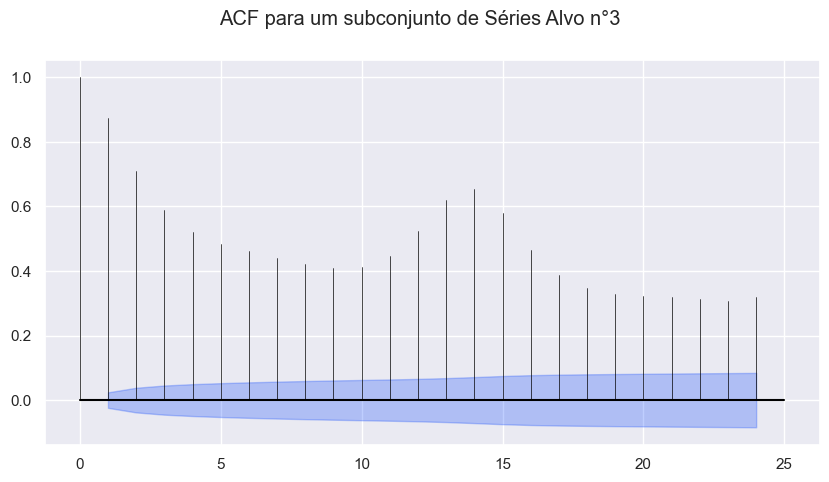

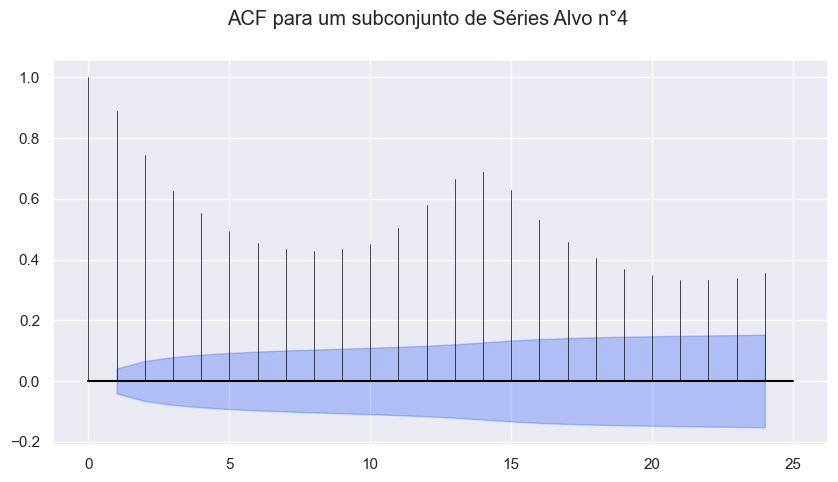

...

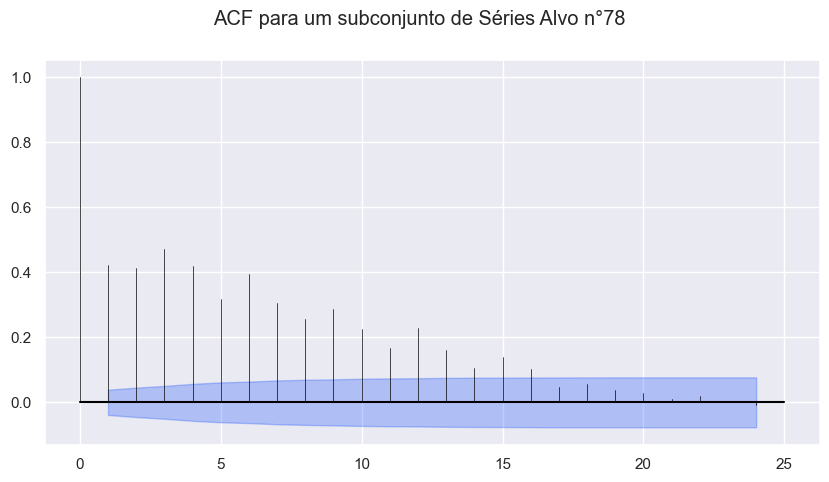

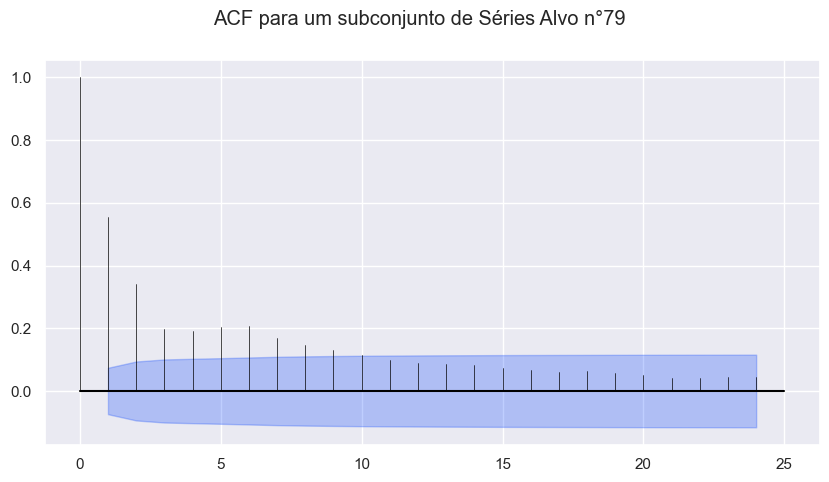

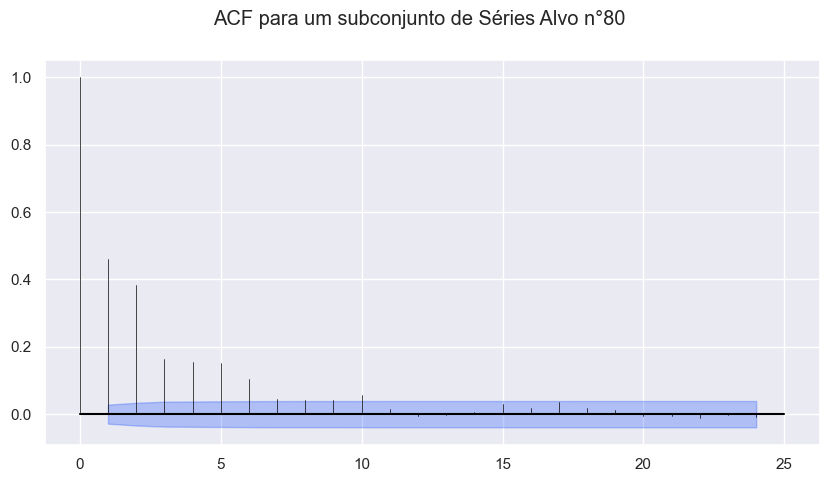

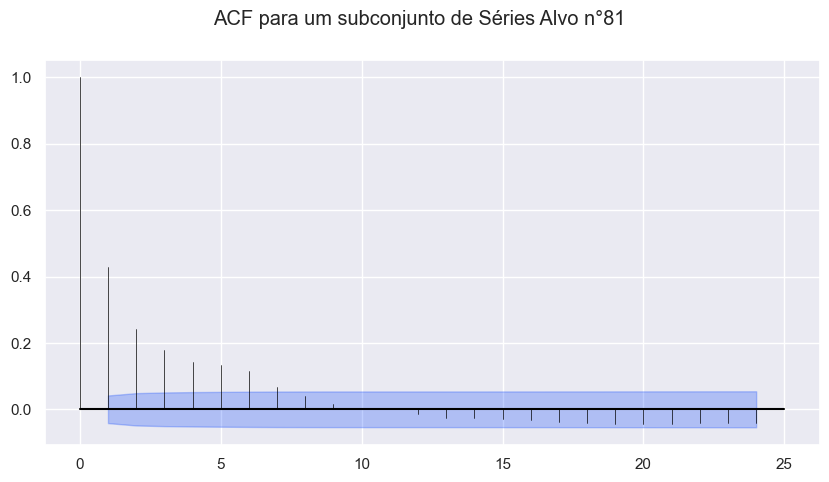

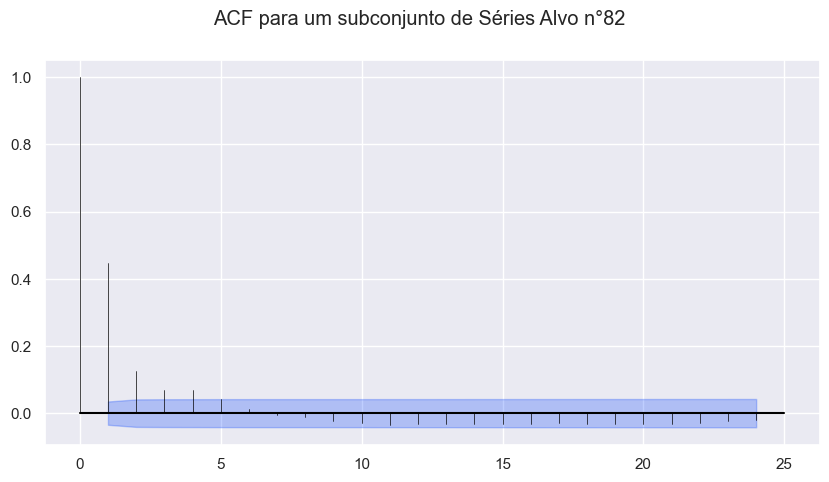

In [ ]:
for idx, serie in enumerate(all_targets):
    plot_acf(serie, m=None, max_lag=24, alpha=0.05);
    plt.suptitle(f"ACF para um subconjunto de Séries Alvo n°{idx}")

## Partial Autocorrelation

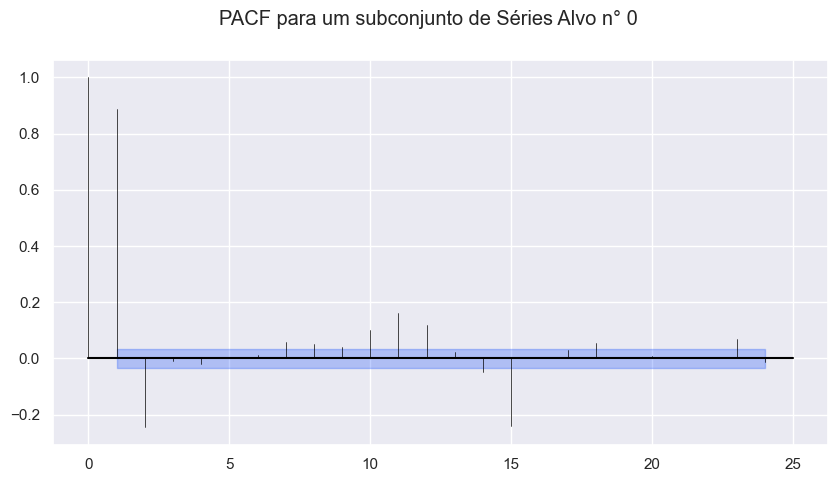

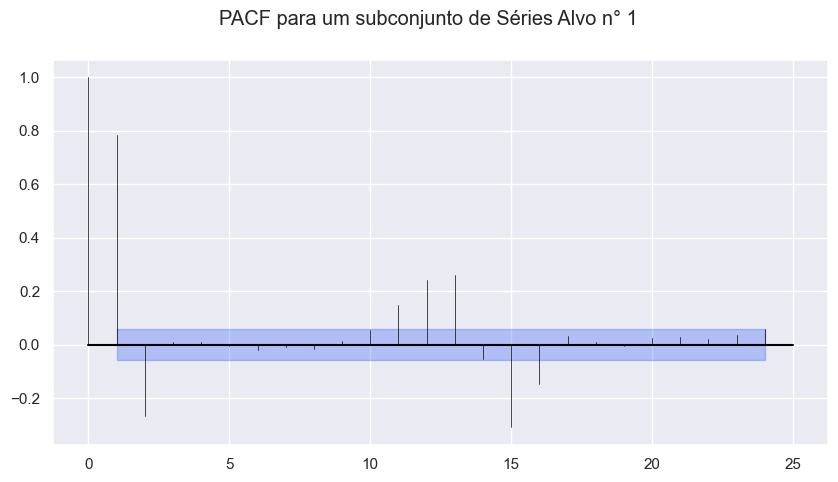

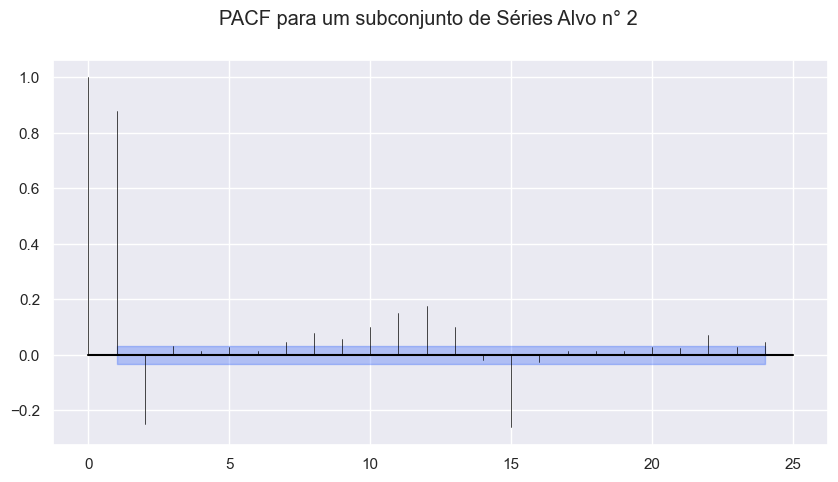

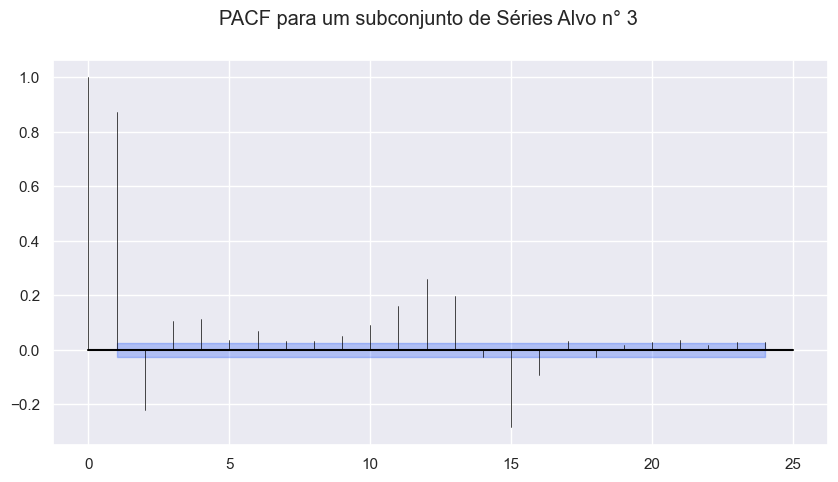

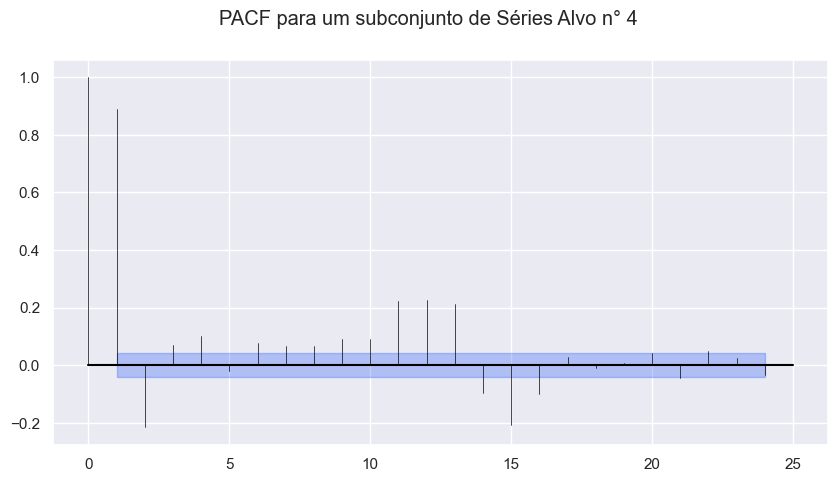

...

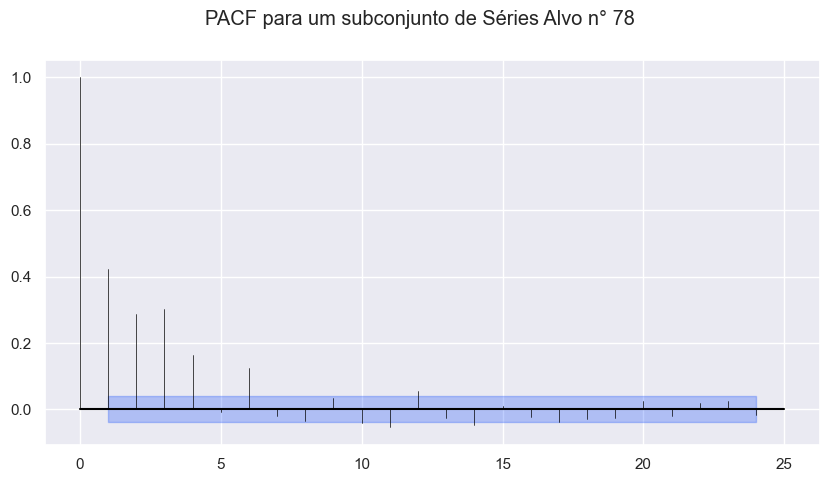

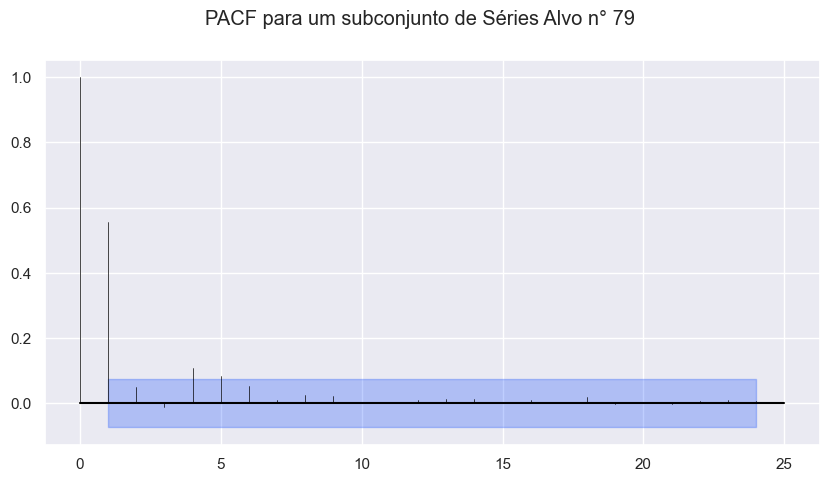

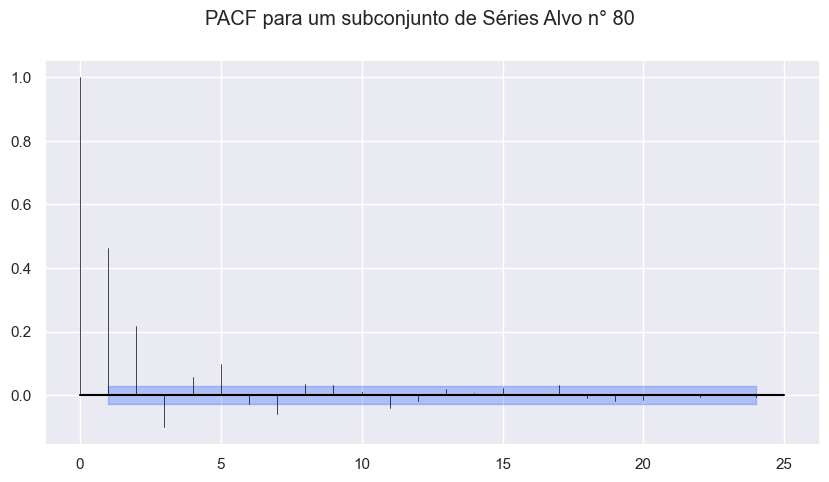

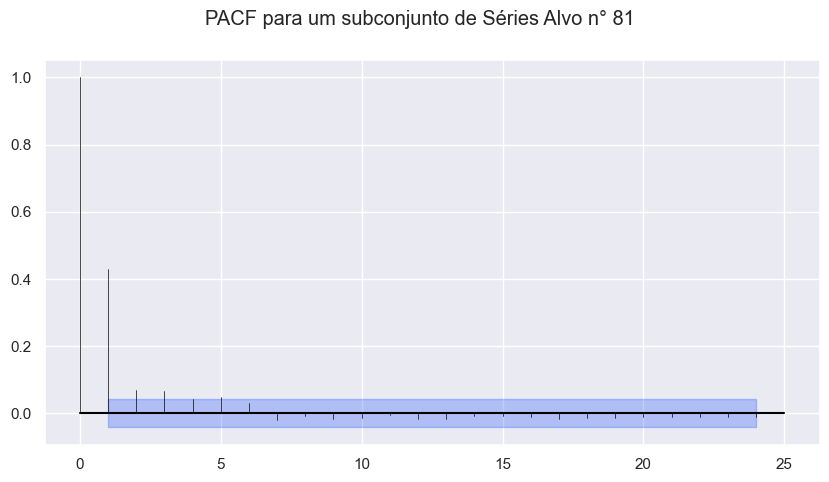

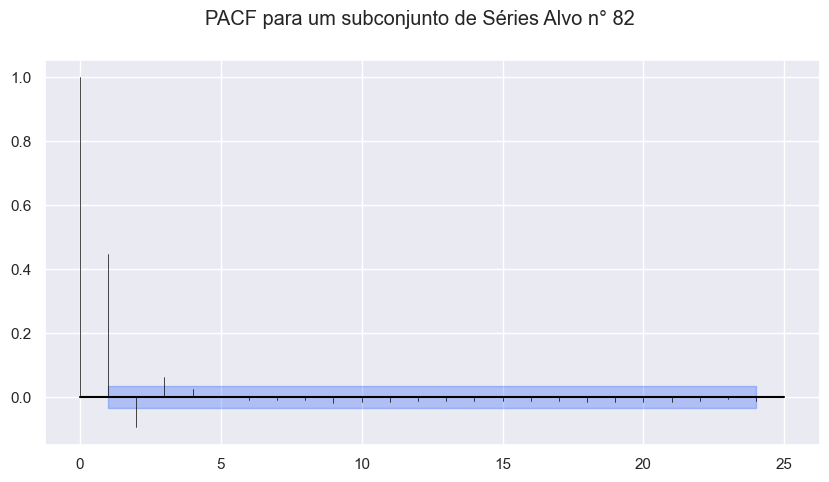

In [ ]:
for idx, serie in enumerate(all_targets):
    plot_pacf(serie, m=None, max_lag=24, alpha=0.05);
    plt.suptitle(f"PACF para um subconjunto de Séries Alvo n° {idx}")

## Cross Correlation Function (CCF)

In [ ]:
# Supondo que all_targets_raw[0] e all_past_covariates_raw[0]['RSRP'] sejam TimeSeries
# plot_ccf(all_targets_raw[0], all_past_covariates_raw[0]['RSRP'], max_lag=20, mode='correlation')
# plt.show()

# for idx, serie in enumerate(all_targets):
#     plot_ccf(serie, ,m=None, max_lag=24, alpha=0.05);
#     plt.suptitle(f"CCF para um subconjunto de Séries Alvo n° {idx}")

## FFT (Fast Fourier Transform)

Transforma o sinal para o domínio da frequência e ajuda a encontrar ciclos dominantes.

In [ ]:
# Série em array
# for serie in processed_series:
#     detect_periodicity_fft(serie)

## Decomposição da Série Temporal

In [ ]:
# for serie in processed_series:
#     stl = STL(serie.pd_series(), period=60)  # usa o período estimado
#     result = stl.fit()
#     result.plot();

# Treinando modelo

In [ ]:
# Just checking
processed_series[0].pd_dataframe().isna().sum()

component
DL_bitrate    0
dtype: int64

In [ ]:
series = processed_series[0]
train, test = train_test_split(
    series, test_size=0.1, axis=1
)

<Axes: xlabel='time'>

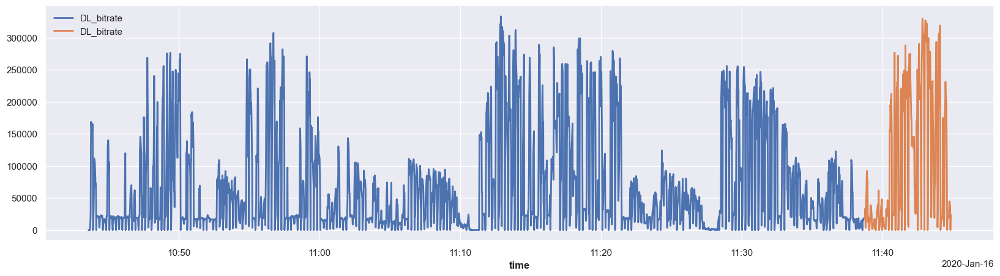

In [ ]:
train.plot()
test.plot()

## Naive

In [ ]:
series = processed_series[0]

historical forecasts:   0%|          | 0/146 [00:00<?, ?it/s]

MAE: 61842.93607305937
RMSE: 93284.25602525494


<Axes: xlabel='time'>

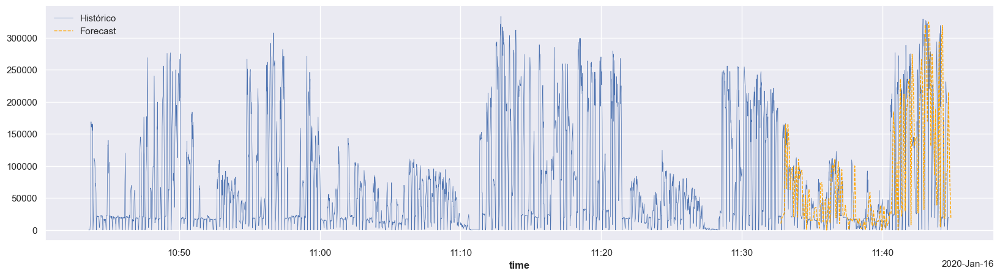

In [ ]:
forecast_horizon = 10
stride = 5

naive_ma = NaiveMovingAverage()

forecast = naive_ma.historical_forecasts(
    series,
    start=0.8,             # ou uma timestamp, ou índice exato
    forecast_horizon=forecast_horizon,
    stride=stride,
    retrain=True,         # ou False, dependendo do modelo
    verbose=True
)

# Concatenar ao longo do tempo (eixo 0)
forecast_series = concatenate(forecast, axis=0)

# Interseção com ground truth
ground_truth = series.slice_intersect(forecast_series)

# Métricas
print("MAE:", mae(ground_truth, forecast_series))
print("RMSE:", rmse(ground_truth, forecast_series))
# print("MAPE:", mape(ground_truth, forecast_series))

# Plot histórico
series[:-forecast_horizon].plot(label="Histórico", lw=0.5)

# # Plot Ground Truth (últimos forecast_horizon pontos reais)
# series[forecast_horizon:].plot(label="Ground Truth", lw=1, color="blue")

# Plot Forecast
forecast.plot(label="Forecast", lw=1, linestyle="--", color="orange")

## Exponential Smoothing

In [ ]:
from darts.utils.utils import ModelMode, SeasonalityMode

### No Trend and No Seasonality

In [ ]:
series = processed_series[0]

AIC: 62162.207471086724
MAE: 64688.869299291146
RMSE: 103326.2080875398


<Axes: xlabel='time'>

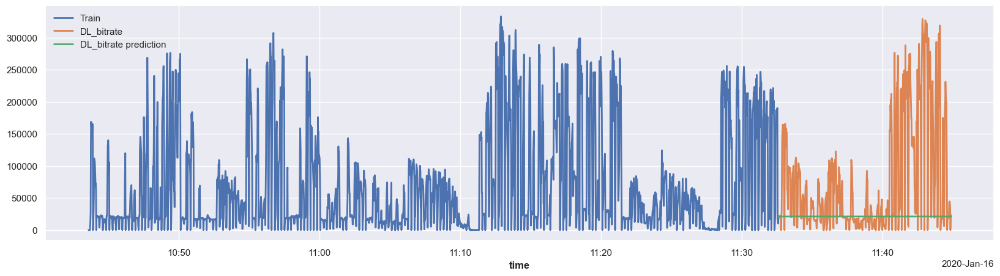

In [ ]:
es_model = ExponentialSmoothing(seasonal=ModelMode.NONE, trend=SeasonalityMode.NONE)

train, test = train_test_split(
    series, test_size=0.2, axis=1
)
es_model.fit(train)
print(f"AIC: {es_model.model.aic}")
y_pred = es_model.predict(len(test)).with_columns_renamed("DL_bitrate", "DL_bitrate prediction")

# print("MAPE:", mape(test, y_pred))
print("MAE:", mae(test, y_pred))
print("RMSE:", rmse(test, y_pred))

train.plot(label="Train")
test.plot()
y_pred.plot()

### Backtesting

In [ ]:
series = processed_series[0]

In [ ]:
forecast_horizon = 10
stride = 5

es_model = ExponentialSmoothing(seasonal=ModelMode.NONE, trend=SeasonalityMode.NONE)

forecast = es_model.historical_forecasts(
    series,
    start=0.8,             # ou uma timestamp, ou índice exato
    forecast_horizon=forecast_horizon,
    stride=stride,
    retrain=True,         # ou False, dependendo do modelo
    verbose=True
)

historical forecasts:   0%|          | 0/146 [00:00<?, ?it/s]

MAE: 61822.99476256032
RMSE: 93233.92345881148


<Axes: xlabel='time'>

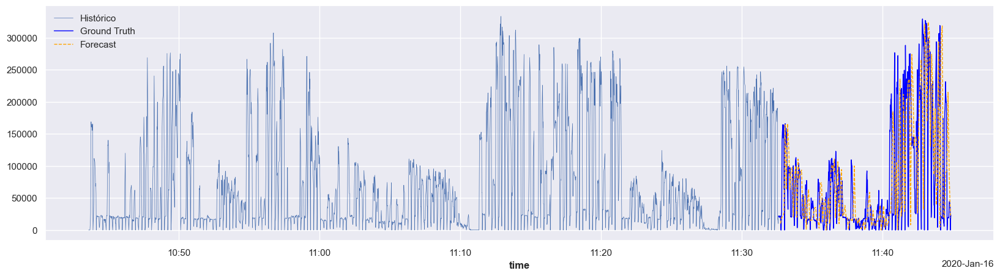

In [ ]:
# Concatenar ao longo do tempo (eixo 0)
forecast_series = concatenate(forecast, axis=0)

# Interseção com ground truth
ground_truth = series.slice_intersect(forecast_series)

# Métricas
print("MAE:", mae(ground_truth, forecast_series))
print("RMSE:", rmse(ground_truth, forecast_series))
# print("MAPE:", mape(ground_truth, forecast_series))

# Plot histórico
series[:-forecast_horizon].plot(label="Histórico", lw=0.5)

# Plot Ground Truth (últimos forecast_horizon pontos reais)
test.plot(label="Ground Truth", lw=1, color="blue")

# Plot Forecast
forecast.plot(label="Forecast", lw=1, linestyle="--", color="orange")

### With Trend and Seasonality

In [ ]:
series = processed_series[0]

AIC: 62659.866717185825
MAE: 67515.997592618
RMSE: 80359.51182203167


<Axes: xlabel='time'>

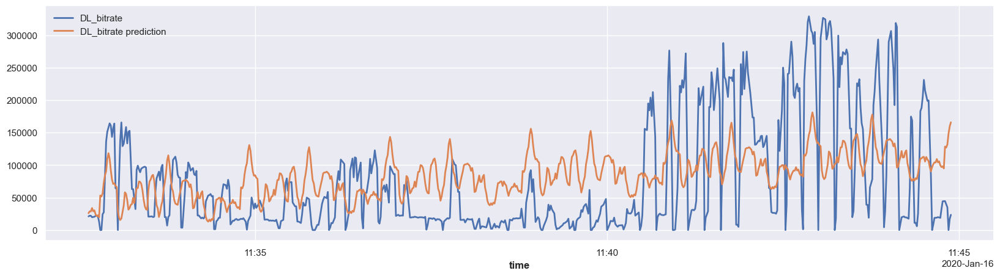

In [ ]:
es_model = ExponentialSmoothing(seasonal=ModelMode.ADDITIVE, trend=SeasonalityMode.ADDITIVE, seasonal_periods=60*2)

train, test = train_test_split(
    series, test_size=0.2, axis=1
)
es_model.fit(train)
print(f"AIC: {es_model.model.aic}")
y_pred = es_model.predict(len(test)).with_columns_renamed("DL_bitrate", "DL_bitrate prediction")

# print("MAPE:", mape(test, y_pred))
print("MAE:", mae(test, y_pred))
print("RMSE:", rmse(test, y_pred))

test.plot()
y_pred.plot()

### Only Seasonal Extracted by FFT

In [ ]:
series = processed_series[0]
seasonal_periods=221

AIC: 62803.43601235833
MAE: 81445.00255245493
RMSE: 113039.42157236776


<Axes: xlabel='time'>

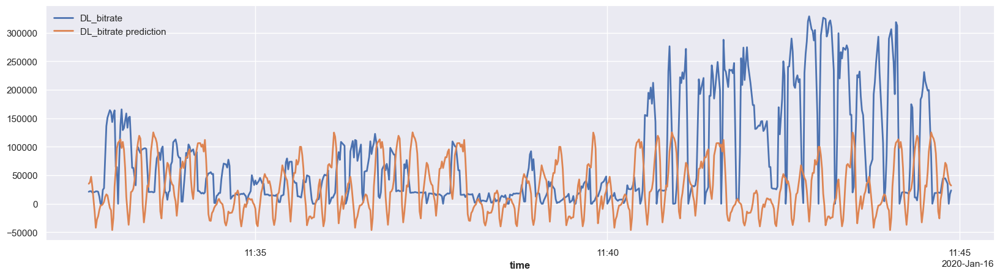

In [ ]:
es_model = ExponentialSmoothing(
    seasonal=ModelMode.ADDITIVE, # experimente com "multiplicative" se fizer sentido
    trend=SeasonalityMode.NONE, 
    seasonal_periods=seasonal_periods # Período estimado pela FFT
    )

train, test = train_test_split(
    series, test_size=0.2, axis=1
)
es_model.fit(train)
print(f"AIC: {es_model.model.aic}")
y_pred = es_model.predict(len(test)).with_columns_renamed("DL_bitrate", "DL_bitrate prediction")

# print("MAPE:", mape(test, y_pred))
print("MAE:", mae(test, y_pred))
print("RMSE:", rmse(test, y_pred))

test.plot()
y_pred.plot()

### Backtest: Only Seasonal Extracted by FFT

In [ ]:
series = processed_series[0]
seasonal_periods=221
forecast_horizon = 10
stride = 5

es_model = ExponentialSmoothing(
    seasonal=ModelMode.ADDITIVE, # experimente com "multiplicative" se fizer sentido
    trend=SeasonalityMode.NONE, 
    seasonal_periods=221 # Período estimado pela FFT
    )

forecast = es_model.historical_forecasts(
    series,
    start=0.8,             # ou uma timestamp, ou índice exato
    forecast_horizon=forecast_horizon,
    stride=stride,
    retrain=True,         # ou False, dependendo do modelo
    verbose=True
)

historical forecasts:   0%|          | 0/146 [00:00<?, ?it/s]

MAE: 91510.35127234946
RMSE: 119838.8661247231


<Axes: xlabel='time'>

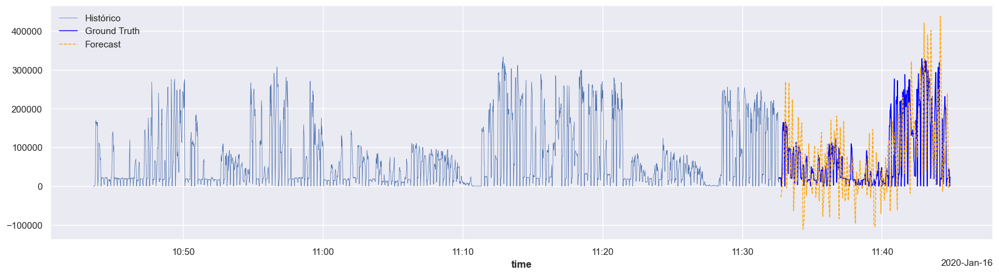

In [ ]:
# Concatenar ao longo do tempo (eixo 0)
forecast_series = concatenate(forecast, axis=0)

# Interseção com ground truth
ground_truth = series.slice_intersect(forecast_series)

# Métricas
print("MAE:", mae(ground_truth, forecast_series))
print("RMSE:", rmse(ground_truth, forecast_series))
# print("MAPE:", mape(ground_truth, forecast_series))

# Plot histórico
series[:-forecast_horizon].plot(label="Histórico", lw=0.5)

# Plot Ground Truth (últimos forecast_horizon pontos reais)
test.plot(label="Ground Truth", lw=1, color="blue")

# Plot Forecast
forecast.plot(label="Forecast", lw=1, linestyle="--", color="orange")

## AutoARIMA

### No Seasonal

In [ ]:
series = processed_series[0]

In [ ]:
auto_arima_model = AutoARIMA(seasonal=False, stepwise=True)

train, test = train_test_split(
    series, test_size=0.2, axis=1
)
auto_arima_model.fit(train)

AutoARIMA(add_encoders=None, seasonal=False, stepwise=True)

In [ ]:
auto_arima_model.model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2944
Model:               SARIMAX(4, 1, 3)   Log Likelihood              -35007.855
Date:                Tue, 20 May 2025   AIC                          70033.710
Time:                        22:13:48   BIC                          70087.595
Sample:                             0   HQIC                         70053.111
                               - 2944                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     40.3695     65.171      0.619      0.536     -87.364     168.103
ar.L1         -0.2023      0.019    -10.735      0.000      -0.239      -0.165
ar.L2          0.1096      0.014      7.702      0.000       0.082       0.137
ar.L3          0.6872      0.014     48.685      0.000       0.660       0.715
ar.L4         -0.2881      0.014    -20.721      0.000      -0.315      -0.261
ma.L1          0.3053      0.013     22.919      0.000       0.279       0.331
ma.L2         -0.2792      0.011    -25.473      0.000      -0.301      -0.258
ma.L3         -0.9443      0.012    -78.381      0.000      -0.968      -0.921
sigma2      1.314e+09   3.83e-05   3.43e+13      0.000    1.31e+09    1.31e+09
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):             13420.44
Prob(Q):                              0.63   Prob(JB):                         0.00
Heteroskedasticity (H):               1.52   Skew:                            -0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.84e+28. Standard errors may be unstable.
"""

MAE: 92940.88574109739
RMSE: 101778.27863339687


<Axes: xlabel='time'>

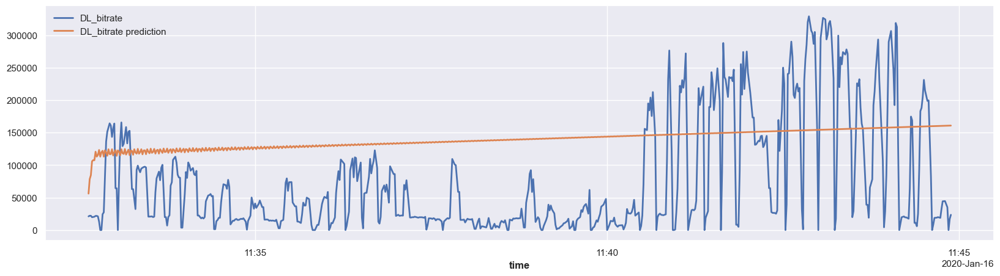

In [ ]:
y_pred = auto_arima_model.predict(len(test)).with_columns_renamed("DL_bitrate", "DL_bitrate prediction")

# print("MAPE:", mape(test, y_pred))
print("MAE:", mae(test, y_pred))
print("RMSE:", rmse(test, y_pred))

test.plot()
y_pred.plot()

### AutoARIMA Backtest

In [ ]:
forecast_horizon = 10
stride = 5

auto_arima_model = AutoARIMA(seasonal=False)

forecast = auto_arima_model.historical_forecasts(
    series,
    start=0.8,             # ou uma timestamp, ou índice exato
    forecast_horizon=forecast_horizon,
    stride=stride,
    retrain=True,         # ou False, dependendo do modelo
    verbose=True
)

historical forecasts:   0%|          | 0/146 [00:00<?, ?it/s]

MAE: 2.340348589665953
RMSE: 3.530698203127186
MAPE: 2.5639583999073663


<Axes: xlabel='time'>

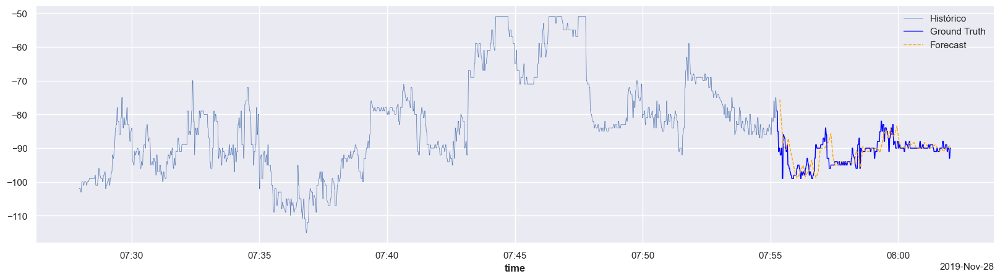

In [ ]:
# Concatenar ao longo do tempo (eixo 0)
forecast_series = concatenate(forecast, axis=0)

# Interseção com ground truth
ground_truth = series.slice_intersect(forecast_series)

# Métricas
print("MAE:", mae(ground_truth, forecast_series))
print("RMSE:", rmse(ground_truth, forecast_series))
print("MAPE:", mape(ground_truth, forecast_series))

# Plot histórico
series[:-forecast_horizon].plot(label="Histórico", lw=0.5)

# Plot Ground Truth (últimos forecast_horizon pontos reais)
test.plot(label="Ground Truth", lw=1, color="blue")

# Plot Forecast
forecast.plot(label="Forecast", lw=1, linestyle="--", color="orange")

### Seasonal

In [ ]:
auto_arima_model = AutoARIMA(seasonal=True)
series = processed_series[0]
train, test = train_test_split(
    series, test_size=0.2, axis=1
)
auto_arima_model.fit(train)

AutoARIMA(add_encoders=None, seasonal=True)

In [ ]:
forecast_horizon = 10
stride = 5

auto_arima_model = AutoARIMA(seasonal=True)

forecast = auto_arima_model.historical_forecasts(
    series,
    start=0.8,             # ou uma timestamp, ou índice exato
    forecast_horizon=forecast_horizon,
    stride=stride,
    retrain=True,         # ou False, dependendo do modelo
    verbose=True
)

historical forecasts:   0%|          | 0/81 [00:00<?, ?it/s]

MAE: 2.340348589665953
RMSE: 3.530698203127186
MAPE: 2.5639583999073663


<Axes: xlabel='time'>

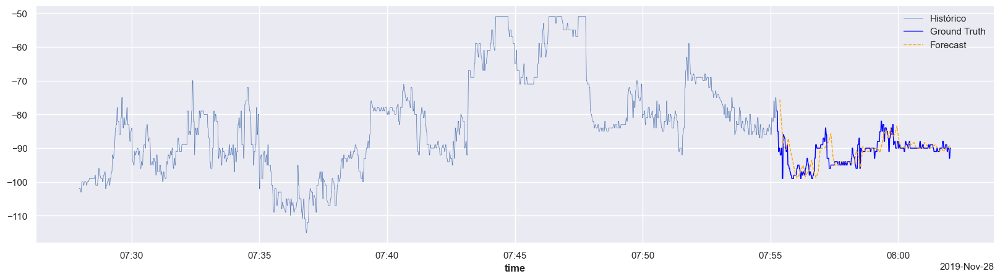

In [ ]:
# Concatenar ao longo do tempo (eixo 0)
forecast_series = concatenate(forecast, axis=0)

# Interseção com ground truth
ground_truth = series.slice_intersect(forecast_series)

# Métricas
print("MAE:", mae(ground_truth, forecast_series))
print("RMSE:", rmse(ground_truth, forecast_series))
print("MAPE:", mape(ground_truth, forecast_series))

# Plot histórico
series[:-forecast_horizon].plot(label="Histórico", lw=0.5)

# Plot Ground Truth (últimos forecast_horizon pontos reais)
test.plot(label="Ground Truth", lw=1, color="blue")

# Plot Forecast
forecast.plot(label="Forecast", lw=1, linestyle="--", color="orange")

# Machine Learning Models

## Simple RNN

In [ ]:
from darts.utils.likelihood_models import GaussianLikelihood

In [ ]:
series = processed_series[0]

# Normalizar (recomendado)
scaler = Scaler()
series_scaled = scaler.fit_transform(series)

train, test = train_test_split(
    series_scaled, test_size=0.2, axis=1
)

# Modelo RNN (pode ser LSTM, GRU também)
model = RNNModel(
    model='GRU',
    input_chunk_length=30,
    output_chunk_length=10,
    hidden_dim=25,
    n_rnn_layers=1,
    training_length=60,
    dropout=0.0,
    batch_size=16,
    n_epochs=100,
    optimizer_kwargs={'lr': 1e-3},
    random_state=42,
    likelihood=GaussianLikelihood(),
    pl_trainer_kwargs={"accelerator": "cpu"},  # ou "cpu" se necessário
)

# Treinar modelo
model.fit(train, verbose=True)

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | GRU              | 2.1 K  | train
6 | V               | Linear           | 52     | train
-------------------------------------------------------------
2.2 K     Trainable params
0         Non-trainable params
2.2 K     Total params
0.009     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


RNNModel(model=GRU, hidden_dim=25, n_rnn_layers=1, dropout=0.0, training_length=60, input_chunk_length=30, output_chunk_length=10, batch_size=16, n_epochs=100, optimizer_kwargs={'lr': 0.001}, random_state=42, likelihood=GaussianLikelihood(prior_mu=None, prior_sigma=None, prior_strength=1.0, beta_nll=0.0), pl_trainer_kwargs={'accelerator': 'cpu'})

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

MAE: 32.474054144502375
RMSE: 35.42412038822832
MAPE: 35.706771664680225


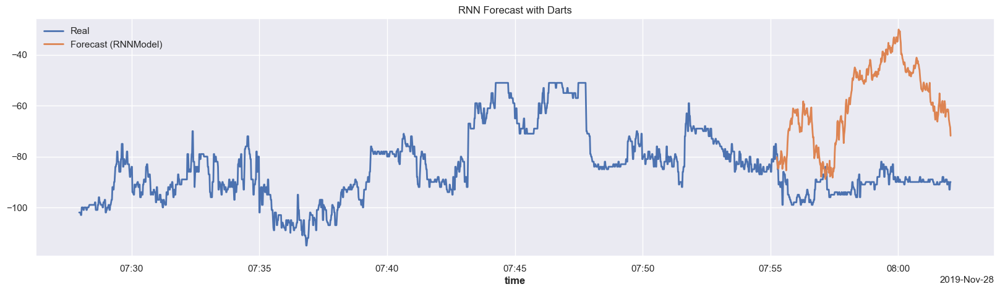

In [ ]:
# Prever
forecast = model.predict(n=len(test))

# Inverter escala
test_back = scaler.inverse_transform(test)
forecast_back = scaler.inverse_transform(forecast)
series_back = scaler.inverse_transform(series_scaled)

# Métricas
print("MAE:", mae(test_back, forecast_back))
print("RMSE:", rmse(test_back, forecast_back))
print("MAPE:", mape(test_back, forecast_back))

# Visualização
series_back.plot(label="Real")
forecast_back.plot(label="Forecast (RNNModel)")
plt.title("RNN Forecast with Darts")
plt.legend()
plt.show()

### Teste com HMM (Hidden Markov Models)

In [ ]:
from hmmlearn.hmm import GaussianHMM

In [ ]:
# Série original (Darts TimeSeries)
series = processed_series[0]

In [ ]:
# Normalizar para melhor estabilidade numérica
scaler = Scaler()
series_scaled = scaler.fit_transform(series)

# Converter para array
y = series_scaled.values().flatten().reshape(-1, 1)

# Definir e treinar HMM
n_states = 4  # número de estados ocultos
model = GaussianHMM(n_components=n_states, covariance_type="diag", n_iter=1000, random_state=42)
model.fit(y)

Model is not converging.  Current: 2693.490512205655 is not greater than 2693.5121386352203. Delta is -0.02162642956545824


GaussianHMM(n_components=4, n_iter=1000, random_state=42)

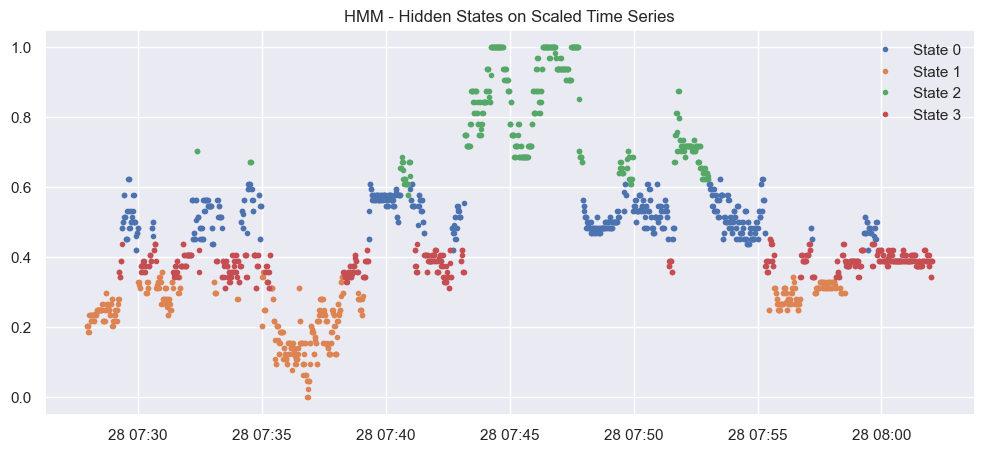

In [ ]:
# Obter estados ocultos
hidden_states = model.predict(y)

# Plotar a série com os estados ocultos
plt.figure(figsize=(12, 5))
for i in range(n_states):
    mask = hidden_states == i
    plt.plot(series.time_index[mask], y[mask], '.', label=f"State {i}")
plt.title("HMM - Hidden States on Scaled Time Series")
plt.legend()
plt.show()

# Testes